In [1]:

# 在这个 cell 上方加上一个标记来定义参数
# parameters
# target = ['TN loss  (%)', 'NH3-N loss  (%)', "N2O-N loss  (%)",'TC loss  (%)',,'CO2-C loss  (%)']
target = 'CH4-C loss (%)' # 要预测啥就换个名字
labels = ['TN loss  (%)', 'NH3-N loss  (%)', "N2O-N loss  (%)", 'TC loss  (%)', 'CH4-C loss (%)', 'CO2-C loss  (%)']

In [2]:
# Parameters
target = "CH4-C loss (%)"


In [3]:
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import joblib
import os
import warnings
import json
import pickle
from deap import base, creator, tools, algorithms
import random

warnings.filterwarnings('ignore')  
plt.rcParams['font.sans-serif']=['SimHei'] #显示中文  

# 设置Seaborn样式
sns.set(font='Microsoft YaHei')


In [4]:
# 获取字典保存各个模型的最终结果
result_mse = {}
result_r2 = {}
result_mae = {}



output_file = 'output/TN_NH3_N2O_TC loss_CH4-C loss_CO2-C loss' # 输出文件夹
input_file = 'data/TN_NH3_N2O_TC loss_CH4-C loss_CO2-C loss' # 输入数据文件夹
model_save_file = f'{output_file}/model_{target}' # 模型参数文件夹

# output_file = 'output/EF_LNEF_N2O_LNRN2O'
# input_file = 'data/EF_LNEF_N2O_LNRN2O'
# model_save_file = f'output/EF_LNEF_N2O_LNRN2O/model_{target}'

os.makedirs(output_file, exist_ok=True)
os.makedirs(model_save_file, exist_ok=True)

# 设置日志
from utils import set_logger
import logging
log_path = output_file + f"/train.log" # 日志路径
# 设置日志和种子数
os.makedirs(os.path.dirname(log_path), exist_ok=True)
set_logger(log_path)

logging.info('{} Prediction Training--------------------------------------------------------------------------------------'.format(target))

In [5]:
data_path = f'{input_file}/data_for_{target}.csv'
model_performance_path = f'{output_file}/Model_{target}.html'
mse_json = f'{output_file}/result_mse_{target}.json'
mae_json = f'{output_file}/result_mae_{target}.json'
r2_json = f'{output_file}/result_r2_{target}.json'

#### 数据集划分

In [6]:
data_all_ef = pd.read_csv(data_path)
X_all = data_all_ef.iloc[:, :-1]
y_all = data_all_ef.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.2, random_state=2023)
y_train = y_train.reset_index(drop=True)

## 为了正确评估模型性能，将数据划分为训练集和测试集，并在训练集上训练模型，在测试集上验证模型性能。
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True)

input_cols = X_all.columns.tolist()

In [7]:
# 看是否有缺失值
y_train.isnull().any()

False

### 树模型预测（RF，XGB，LGB，CTB）

#### RF

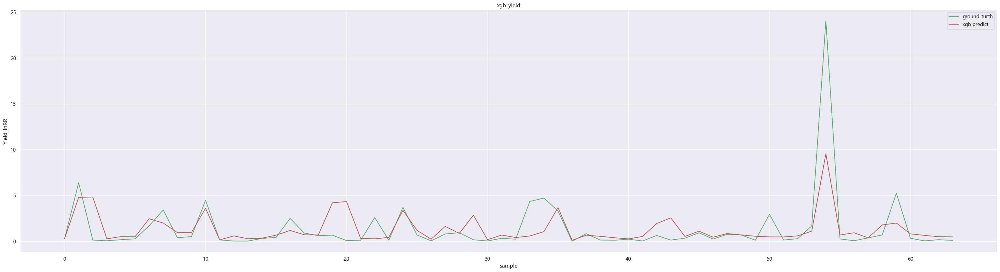

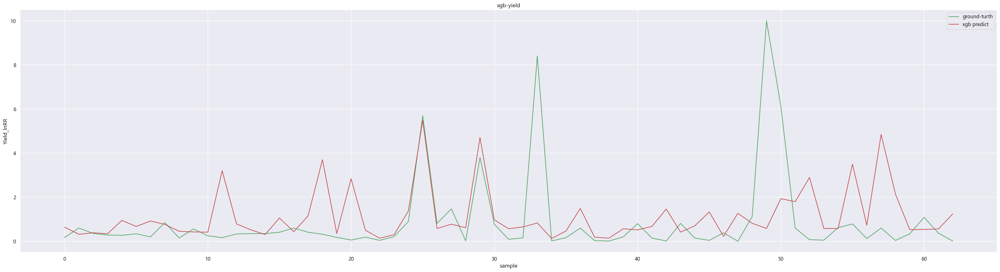

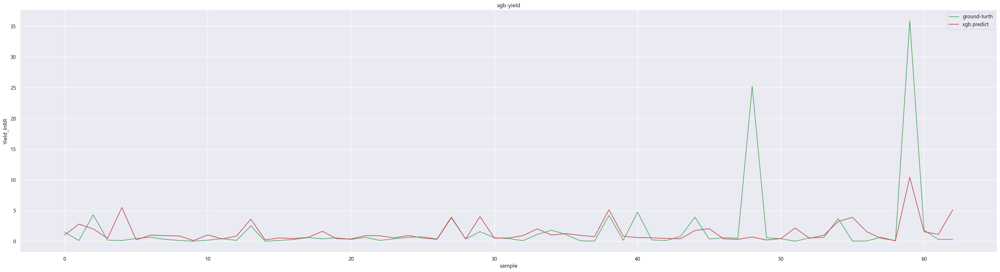

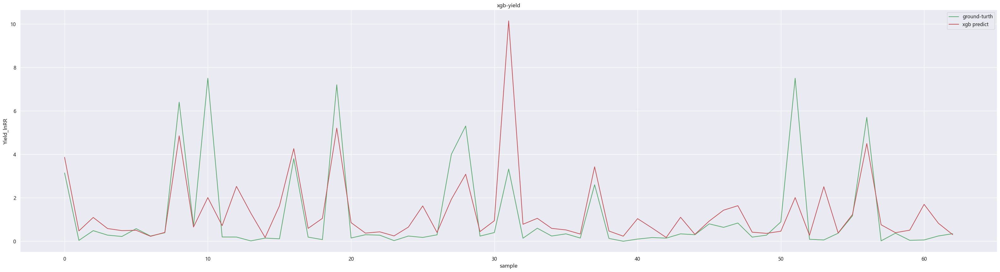

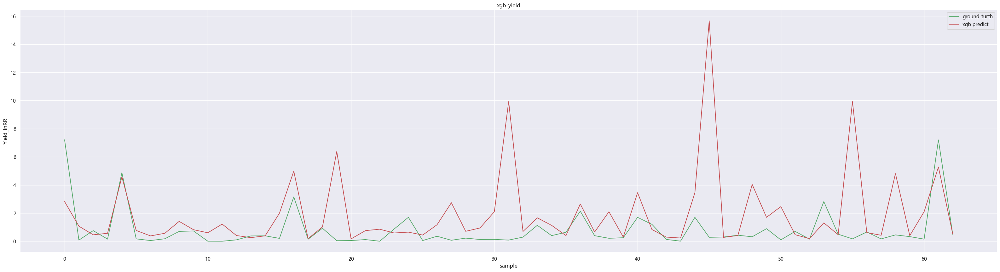

In [8]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=1000, criterion='friedman_mse',
                            max_depth=10, min_samples_split=2,
                            min_samples_leaf=1, min_weight_fraction_leaf=0.0,
                            max_leaf_nodes=None,
                            bootstrap=True, oob_score=False,
                            n_jobs=1, random_state=None,
                            verbose=0, warm_start=False)

rf_preds = np.zeros(X_train.shape[0])

logging.info('RF Training Begin--------------------------------------------------------------------------------------')
for i, (train_index, valid_index) in enumerate(kf.split(X_train)):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]

    rf_model.fit(x_tr, y_tr)
    rf_pred_valid = rf_model.predict(x_va)
    rf_preds[valid_index] = rf_pred_valid

    logging.info('{}, {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the RFRegression is: {}'.format(metrics.mean_squared_error(y_va,rf_pred_valid)))
    logging.info('Train: The mae of the RFRegression is: {}'.format(metrics.mean_absolute_error(y_va,rf_pred_valid)))
    logging.info('Train: The R2 of the RFRegression is: {}'.format(metrics.r2_score(y_va,rf_pred_valid)))
    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, rf_pred_valid, 'r', label='xgb predict')
    plt.legend(loc='best')
    plt.title('xgb-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

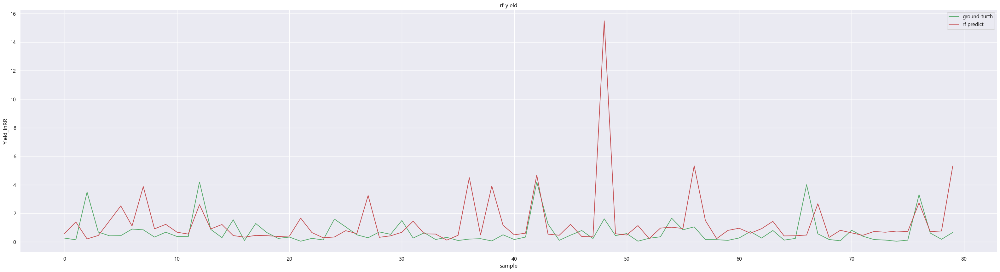

In [9]:
rf_pred_test = rf_model.predict(X_test)

logging.info('Test: The rmse of the RFRegression is: {}'.format(metrics.mean_squared_error(y_test, rf_pred_test)))
logging.info('Test: The mae of the RFRegression is: {}'.format(metrics.mean_absolute_error(y_test, rf_pred_test)))
logging.info('Test: The R2 of the RFRegression is: {}'.format(metrics.r2_score(y_test, rf_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x[:100], y_test[:100], 'g', label='ground-turth')
plt.plot(x[:100], rf_pred_test[:100], 'r', label='rf predict')
plt.legend(loc='best')
plt.title('rf-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(rf_model, f'{model_save_file}/rf_model.pkl') 
result_mse['RandomForest(k)'] = metrics.mean_squared_error(y_test,rf_pred_test)
result_mae['RandomForest(k)'] = metrics.mean_absolute_error(y_test,rf_pred_test)
result_r2['RandomForest(k)'] = metrics.r2_score(y_test,rf_pred_test)
logging.info('RandomForest Test Result: MSE: {}'.format(result_mse['RandomForest(k)']))
logging.info('RandomForest Test Result: MSE: {}'.format(result_mae['RandomForest(k)']))
logging.info('RandomForest Test Result: R2: {}'.format(result_r2['RandomForest(k)']))
logging.info('RF Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': rf_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/rf_pred.csv', index=False)

#### XGB

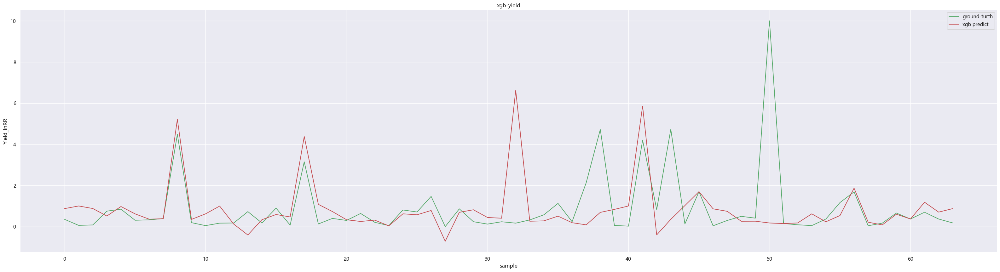

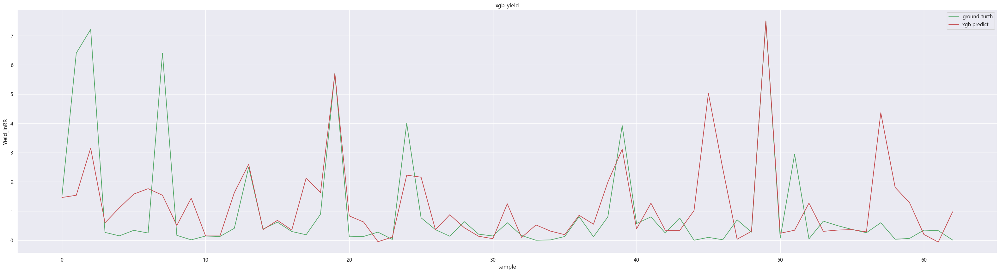

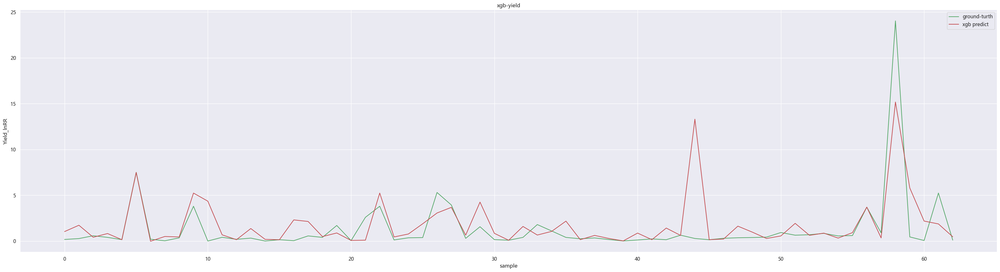

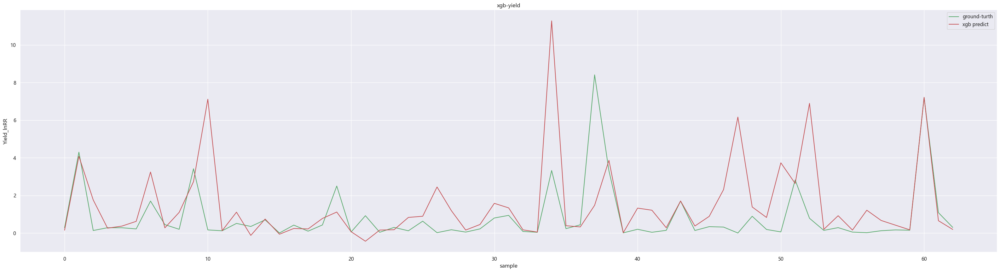

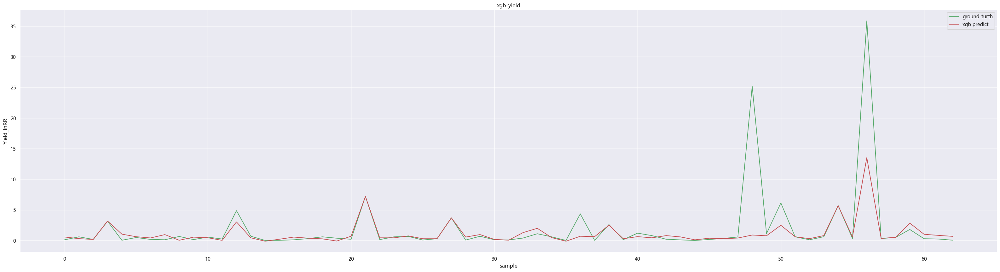

In [10]:
import xgboost as xgb

xgb_preds = np.zeros(X_train.shape[0])
kf = KFold(n_splits=num_folds, shuffle=True)
xgb_model = xgb.XGBRegressor(max_depth=8, learning_rate=0.1, n_estimators=300,
                        n_jobs=4, colsample_bytree=0.8, subsample=0.8, random_state=32,
                        tree_method='hist')

logging.info('XGB Training Begin--------------------------------------------------------------------------------------')
for train_index, valid_index in kf.split(X_train):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]
    
    xgb_model.fit(x_tr, y_tr)
    xgb_pred_valid = xgb_model.predict(x_va)
    xgb_preds[valid_index] = xgb_pred_valid

    logging.info('{} {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the XgbRegression is: {}'.format(metrics.mean_squared_error(y_va, xgb_pred_valid)))
    logging.info('Train: The mae of the XgbRegression is: {}'.format(metrics.mean_absolute_error(y_va, xgb_pred_valid)))
    logging.info('Train: The R2 of the XgbRegression is: {}'.format(metrics.r2_score(y_va, xgb_pred_valid)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, xgb_pred_valid, 'r', label='xgb predict')
    plt.legend(loc='best')
    plt.title('xgb-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

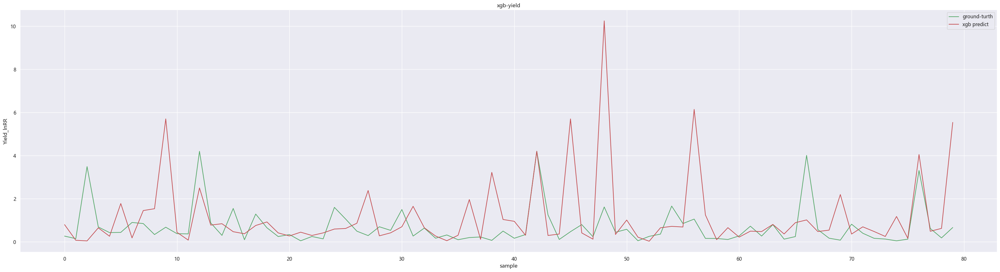

In [11]:
xgb_pred_test = xgb_model.predict(X_test)

logging.info('Test: The rmse of the XgbRegression is: {}'.format(metrics.mean_squared_error(y_test, xgb_pred_test)))
logging.info('Test: The mae of the XgbRegression is: {}'.format(metrics.mean_absolute_error(y_test, xgb_pred_test)))
logging.info('Test: The R2 of the XgbRegression is: {}'.format(metrics.r2_score(y_test, xgb_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, xgb_pred_test, 'r', label='xgb predict')
plt.legend(loc='best')
plt.title('xgb-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(xgb_model, f'{model_save_file}/xgb_model.pkl') 
result_mse['XGBoost(k)'] = metrics.mean_squared_error(y_test,xgb_pred_test)
result_mae['XGBoost(k)'] = metrics.mean_absolute_error(y_test,xgb_pred_test)
result_r2['XGBoost(k)'] = metrics.r2_score(y_test,xgb_pred_test)
logging.info('XGBoost Test Result: MSE: {}'.format(result_mse['XGBoost(k)']))
logging.info('XGBoost Test Result: MSE: {}'.format(result_mae['XGBoost(k)']))
logging.info('XGBoost Test Result: R2: {}'.format(result_r2['XGBoost(k)']))
logging.info('XGB Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': xgb_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/xgb_pred.csv', index=False)

#### LGB

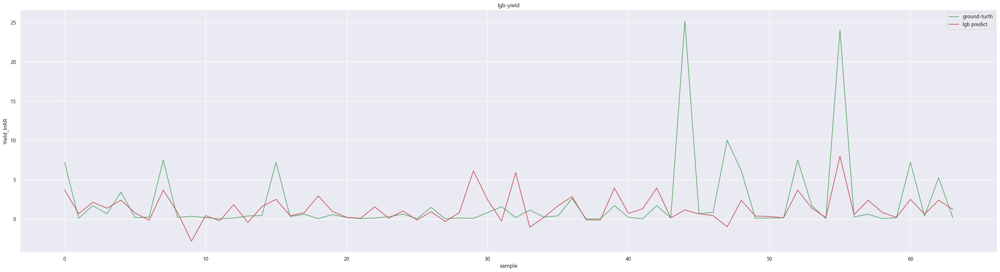

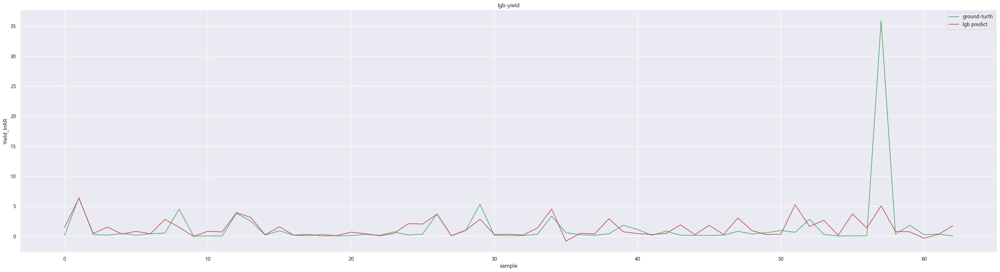

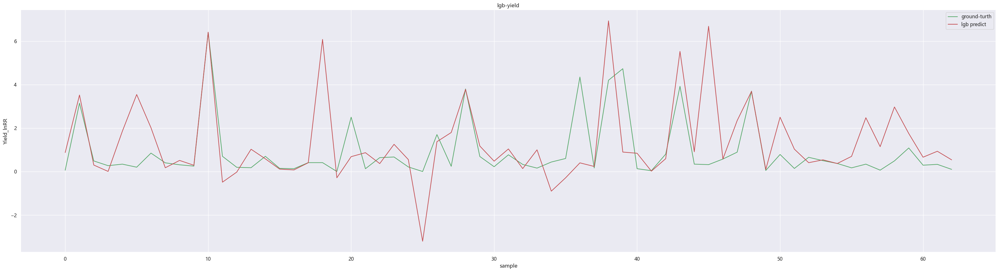

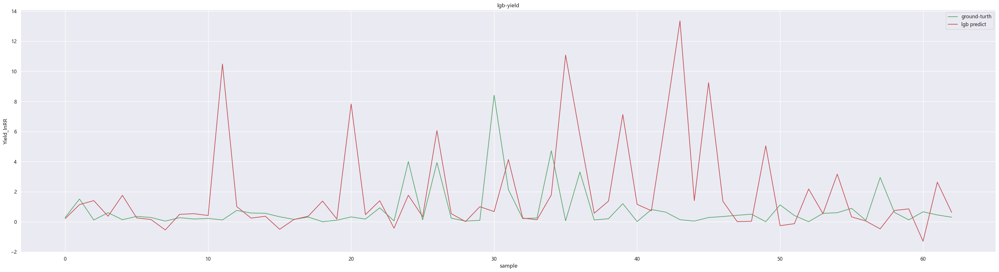

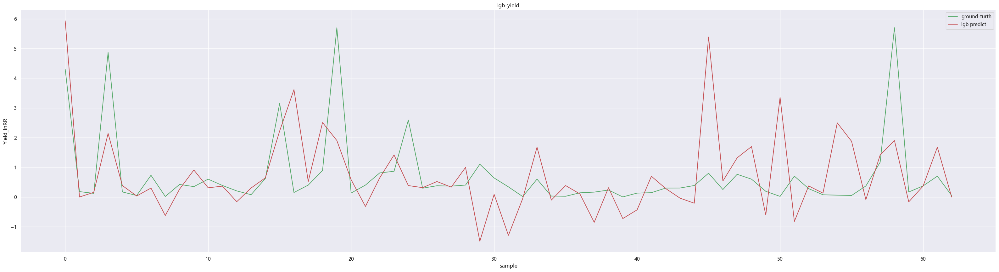

In [12]:
import lightgbm as lgb

lgb_preds = np.zeros(X_train.shape[0])
logging.info('LGB Training Begin--------------------------------------------------------------------------------------')

for i, (train_index, valid_index) in enumerate(kf.split(X_train, y_train)):
    X_tr, y_tr, X_va, y_va = X_train.iloc[train_index], \
        y_train.iloc[train_index], X_train.iloc[valid_index], y_train.iloc[valid_index]

    params_lgb = {
        'boosting_type': 'gbdt',
        'objective': 'regression',
        'learning_rate': 0.1,
        'n_estimators': 300,
        'metric': 'root_mean_squared_error',
        'min_child_weight': 1e-3,
        'min_child_samples': 10,
        'num_leaves': 31,
        'max_depth': -1,
        'seed': 2023,
        'verbose': -1,
    }
    
    lgb_model = lgb.LGBMRegressor(**params_lgb)
    lgb_model.fit(X_tr, y_tr, eval_set=[(X_tr, y_tr), (X_va, y_va)], eval_metric=['mae','rmse'])
    lgb_val_pred = lgb_model.predict(X_va)
    lgb_preds[valid_index] = lgb_val_pred

    logging.info('{}, {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the LgbRegression is: {}'.format(metrics.mean_squared_error(y_va, lgb_val_pred)))
    logging.info('Train: The mae of the LgbRegression is: {}'.format(metrics.mean_absolute_error(y_va, lgb_val_pred)))
    logging.info('Train: The R2 of the LgbRegression is: {}'.format(metrics.r2_score(y_va, lgb_val_pred)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, lgb_val_pred, 'r', label='lgb predict')
    plt.legend(loc='best')
    plt.title('lgb-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

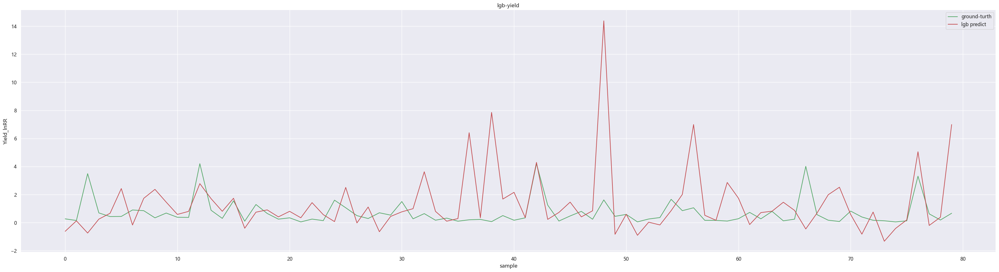

In [13]:
lgb_pred_test = lgb_model.predict(X_test)

logging.info('Test: The rmse of the LgbRegression is: {}'.format(metrics.mean_squared_error(y_test,lgb_pred_test)))
logging.info('Test: The mae of the LgbRegression is: {}'.format(metrics.mean_absolute_error(y_test,lgb_pred_test)))
logging.info('Test: The R2 of the LgbRegression is: {}'.format(metrics.r2_score(y_test,lgb_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x[:100], y_test[:100], 'g', label='ground-turth')
plt.plot(x[:100], lgb_pred_test[:100], 'r', label='lgb predict')
plt.legend(loc='best')
plt.title('lgb-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(lgb_model, f'{model_save_file}/lgb_model.pkl') 
result_mse['Lightgbm(k)'] = metrics.mean_squared_error(y_test,lgb_pred_test)
result_mae['Lightgbm(k)'] = metrics.mean_absolute_error(y_test,lgb_pred_test)
result_r2['Lightgbm(k)'] = metrics.r2_score(y_test,lgb_pred_test)
logging.info('Lightgbm Test Result: MSE: {}'.format(result_mse['Lightgbm(k)']))
logging.info('Lightgbm Test Result: MSE: {}'.format(result_mae['Lightgbm(k)']))
logging.info('Lightgbm Test Result: R2: {}'.format(result_r2['Lightgbm(k)']))
logging.info('LGB Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': lgb_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/lgb_pred.csv', index=False)

#### CTB

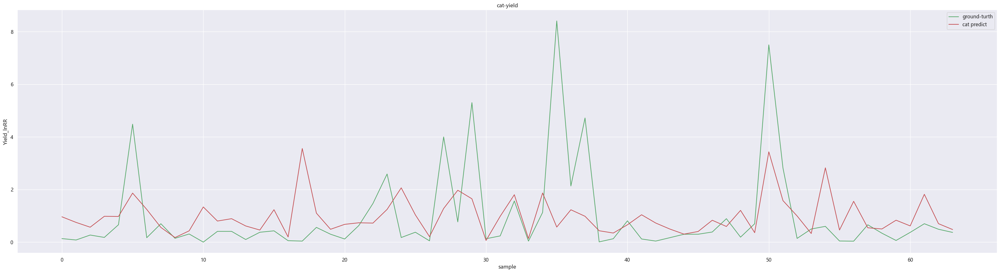

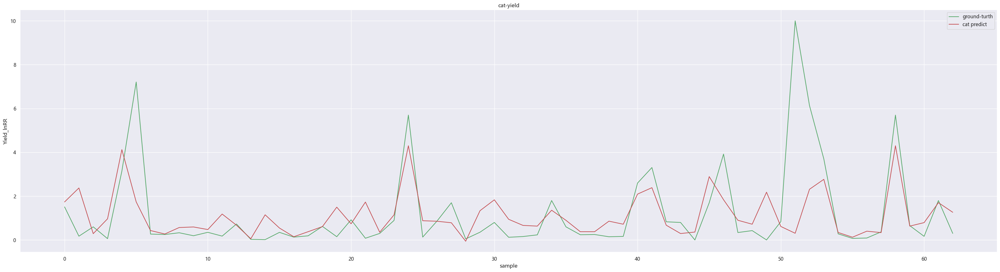

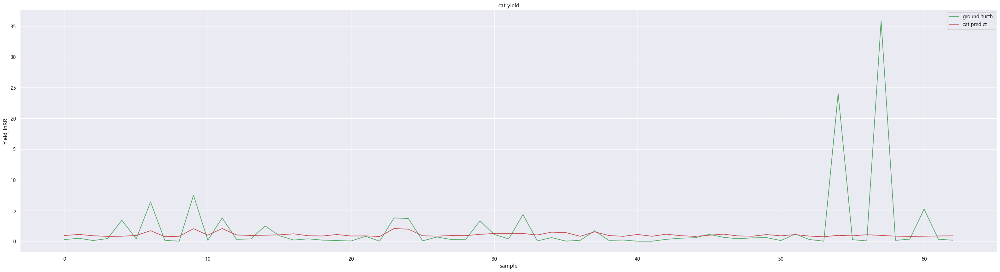

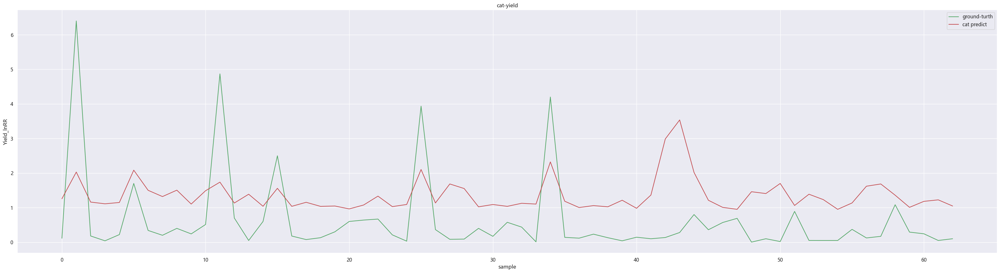

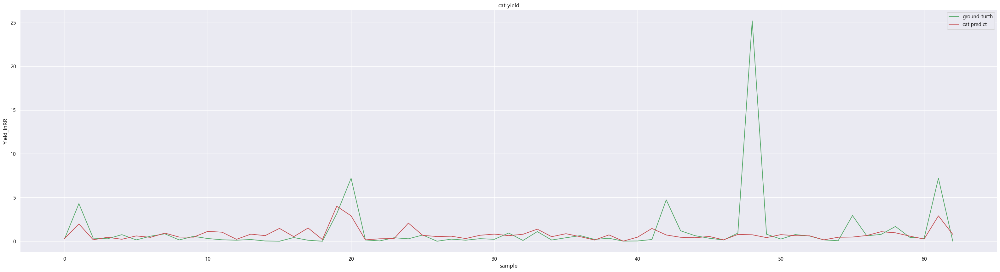

In [14]:
from catboost import CatBoostRegressor

params = {
    'learning_rate': 0.05,
    'loss_function': "RMSE",
    'eval_metric': "RMSE", # CrossEntropy
    'depth': 8,
    'min_data_in_leaf': 20,
    'random_seed': 42,
    'logging_level': 'Silent',
    'use_best_model': True,
    'one_hot_max_size': 5,   #类别数量多于此数将使用ordered target statistics编码方法,默认值为2。
    'boosting_type':"Ordered", #Ordered 或者Plain,数据量较少时建议使用Ordered,训练更慢但能够缓解梯度估计偏差。
    'max_ctr_complexity': 2, #特征组合的最大特征数量，设置为1取消特征组合，设置为2只做两个特征的组合,默认为4。
    'nan_mode': 'Min' 
}
iterations = 400
early_stopping_rounds = 200
ctb_model = CatBoostRegressor(iterations=iterations, early_stopping_rounds = early_stopping_rounds, **params)
logging.info('CatRegression Training --------------------------------------------------------------------------------------')

for i, (train_index, valid_index) in enumerate(kf.split(X_train)):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]
    
    ctb_model.fit(x_tr, y_tr, eval_set=(x_va, y_va), verbose=0, early_stopping_rounds=1000)
    ctb_pre= ctb_model.predict(x_va)

    logging.info('{} {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the CatRegression is: {}'.format(metrics.mean_squared_error(y_va, ctb_pre)))
    logging.info('Train: The mae of the CatRegression is: {}'.format(metrics.mean_absolute_error(y_va, ctb_pre)))
    logging.info('Train: The R2 of the CatRegression is: {}'.format(metrics.r2_score(y_va, ctb_pre)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, ctb_pre, 'r', label='cat predict')
    plt.legend(loc='best')
    plt.title('cat-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

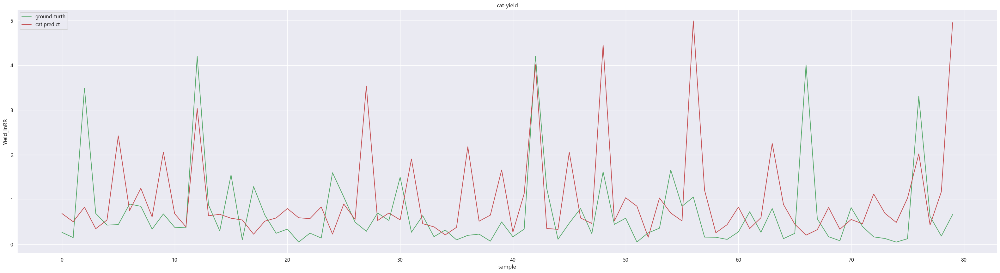

In [15]:
cat_pred_test = ctb_model.predict(X_test)

logging.info('Test: The rmse of the CatRegression is: {}'.format(metrics.mean_squared_error(y_test,cat_pred_test)))
logging.info('Test: The mae of the CatRegression is: {}'.format(metrics.mean_absolute_error(y_test,cat_pred_test)))
logging.info('Test: The R2 of the CatRegression is: {}'.format(metrics.r2_score(y_test,cat_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, cat_pred_test, 'r', label='cat predict')
plt.legend(loc='best')
plt.title('cat-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(ctb_model, f'{model_save_file}/ctb_model.pkl') 
result_mse['CatRegression(k)'] = metrics.mean_squared_error(y_test,cat_pred_test)
result_mae['CatRegression(k)'] = metrics.mean_absolute_error(y_test,cat_pred_test)
result_r2['CatRegression(k)'] = metrics.r2_score(y_test,cat_pred_test)
logging.info('CatRegression Test Result: MSE: {}'.format(result_mse['CatRegression(k)']))
logging.info('CatRegression Test Result: MSE: {}'.format(result_mae['CatRegression(k)']))
logging.info('CatRegression Test Result: R2: {}'.format(result_r2['CatRegression(k)']))
logging.info('CatRegression Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': cat_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/cat_pred.csv', index=False)

### 使用其他机器学习方法预测

#### 岭回归

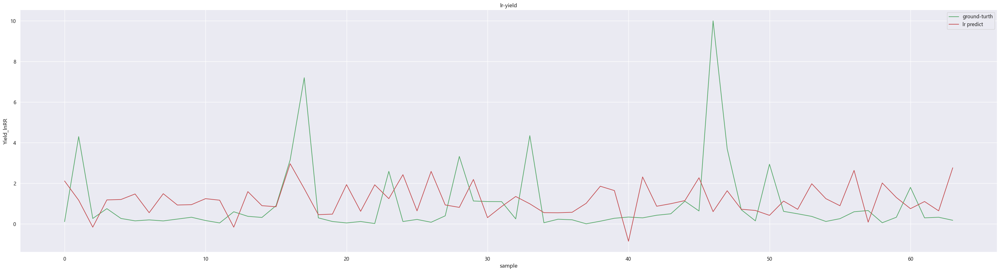

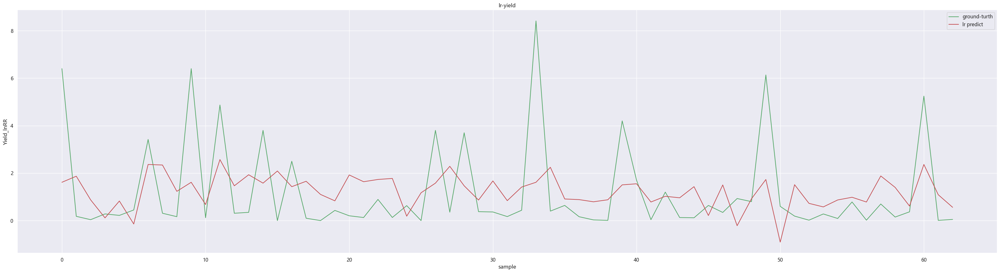

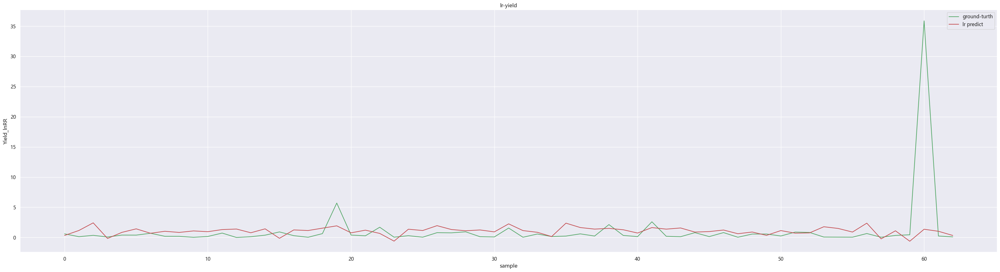

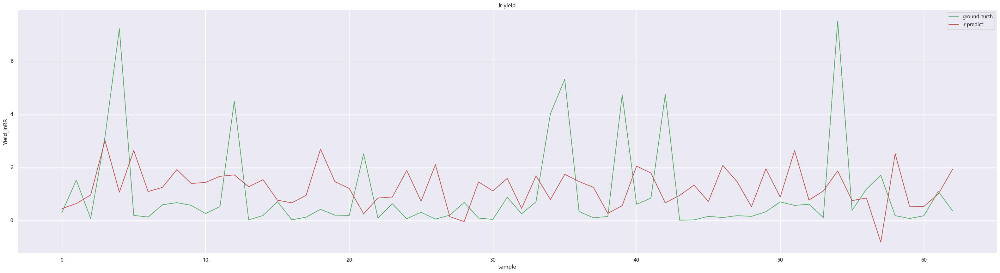

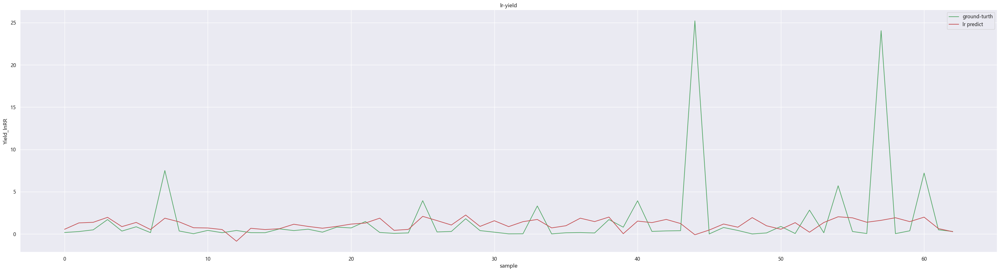

In [16]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline

ri_model = Ridge(alpha=0.5,fit_intercept=True)
ri_preds = np.zeros(X_train.shape[0])
logging.info('RidgeRegression Training --------------------------------------------------------------------------------------')

for train_index, valid_index in kf.split(X_train, y_train):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]

    ri_model.fit(x_tr, y_tr)
    ri_pred_valid = ri_model.predict(x_va)
    ri_preds[valid_index] = ri_pred_valid

    logging.info('{}, {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the RidgeRegression is: {}'.format(metrics.mean_squared_error(y_va, ri_pred_valid)))
    logging.info('Train: The mae of the RidgeRegression is: {}'.format(metrics.mean_absolute_error(y_va, ri_pred_valid)))
    logging.info('Train: The R2 of the RidgeRegression is: {}'.format(metrics.r2_score(y_va, ri_pred_valid)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, ri_pred_valid, 'r', label='lr predict')
    plt.legend(loc='best')
    plt.title('lr-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

The rmse of the test is: 1.2308176546680853


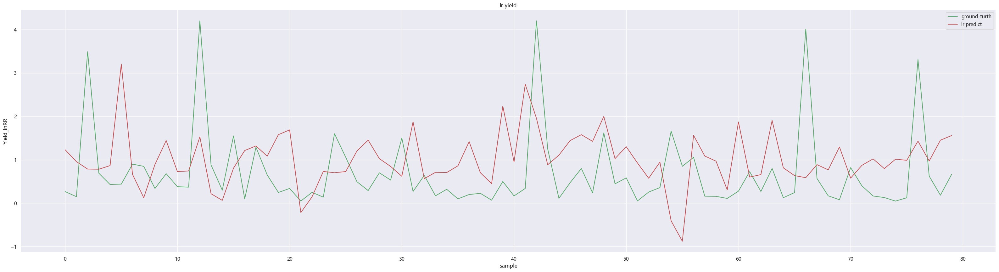

In [17]:
ri_pred_test = ri_model.predict(X_test)

logging.info('Test: The rmse of the RidgeRegression is: {}'.format(metrics.mean_squared_error(y_test, ri_pred_test)))
logging.info('Test: The mae of the RidgeRegression is: {}'.format(metrics.mean_absolute_error(y_test, ri_pred_test)))
logging.info('Test: The R2 of the RidgeRegression is: {}'.format(metrics.r2_score(y_test, ri_pred_test)))

print('The rmse of the test is:',metrics.mean_squared_error(y_test,ri_pred_test))
x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, ri_pred_test, 'r', label='lr predict')
plt.legend(loc='best')
plt.title('lr-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(ri_model, f'{model_save_file}/ri_model.pkl') 
result_mse['RidgeRegression(k)'] = metrics.mean_squared_error(y_test,ri_pred_test)
result_mae['RidgeRegression(k)'] = metrics.mean_absolute_error(y_test,ri_pred_test)
result_r2['RidgeRegression(k)'] = metrics.r2_score(y_test,ri_pred_test)
logging.info('RidgeRegression Test Result: MSE: {}'.format(result_mse['RidgeRegression(k)']))
logging.info('RidgeRegression Test Result: MSE: {}'.format(result_mae['RidgeRegression(k)']))
logging.info('RidgeRegression Test Result: R2: {}'.format(result_r2['RidgeRegression(k)']))
logging.info('RidgeRegression Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': ri_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/ridge_lr_pred.csv', index=False)

#### 线性回归

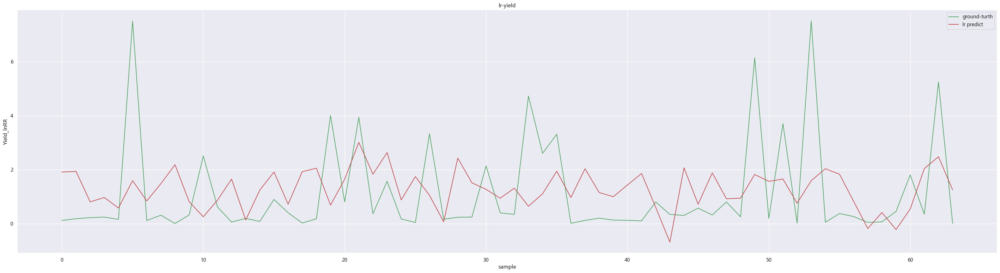

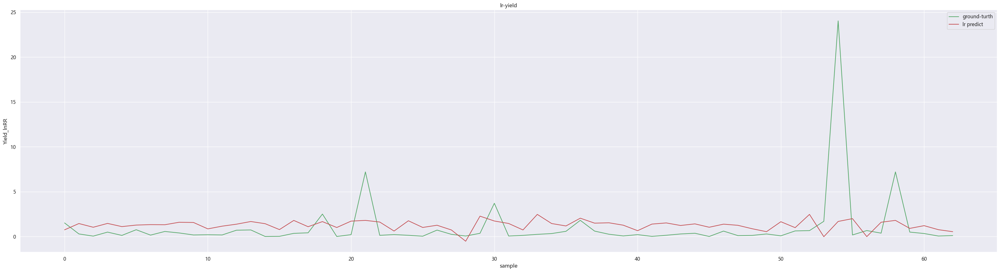

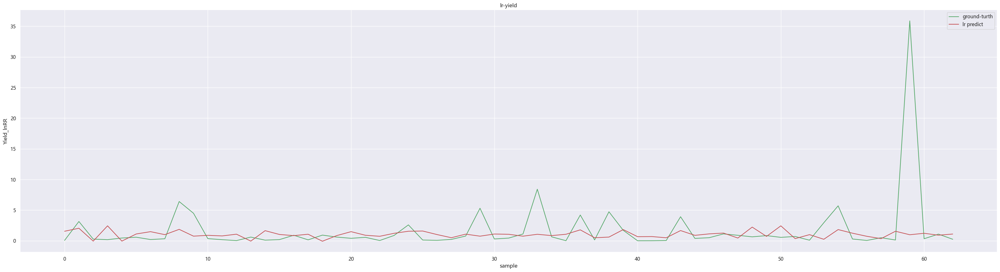

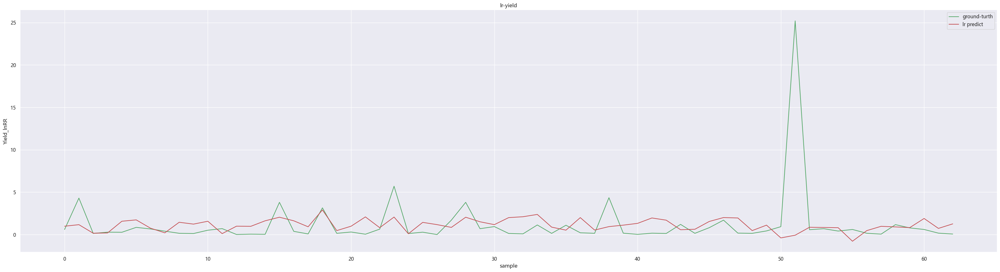

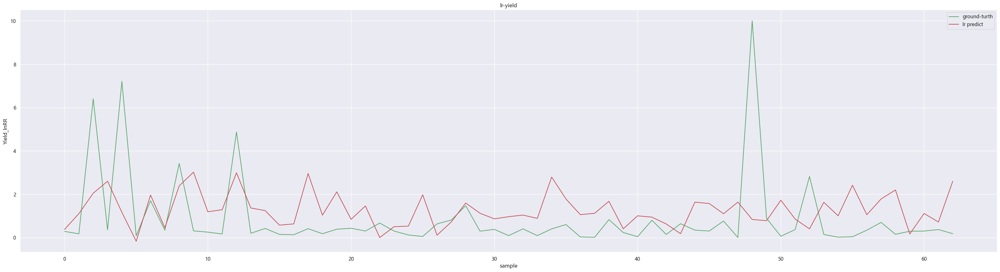

In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

lr_model = LinearRegression(fit_intercept=True,  copy_X=True, n_jobs=1)
lr_preds = np.zeros(X_train.shape[0])
logging.info('LinearRegression Training --------------------------------------------------------------------------------------')

for train_index, valid_index in kf.split(X_train, y_train):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]

    lr_model.fit(x_tr, y_tr)
    lr_pred_valid = lr_model.predict(x_va)
    lr_preds[valid_index] = lr_pred_valid

    logging.info('{}, {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the LR is: {}'.format(metrics.mean_squared_error(y_va, lr_pred_valid)))
    logging.info('Train: The mae of the LR is: {}'.format(metrics.mean_absolute_error(y_va, lr_pred_valid)))
    logging.info('Train: The R2 of the LR is: {}'.format(metrics.r2_score(y_va, lr_pred_valid)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, lr_pred_valid, 'r', label='lr predict')
    plt.legend(loc='best')
    plt.title('lr-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

The rmse of the test is: 1.750399324561629


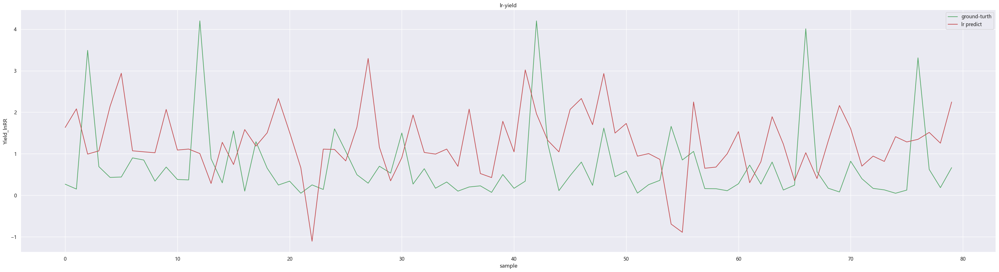

In [19]:
lr_pred_test = lr_model.predict(X_test)

logging.info('Test: The rmse of the LinearRegression is: {}'.format(metrics.mean_squared_error(y_test, lr_pred_test)))
logging.info('Test: The mae of the LinearRegression is: {}'.format(metrics.mean_absolute_error(y_test, lr_pred_test)))
logging.info('Test: The R2 of the LinearRegression is: {}'.format(metrics.r2_score(y_test, lr_pred_test)))

print('The rmse of the test is:',metrics.mean_squared_error(y_test,lr_pred_test))
x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, lr_pred_test, 'r', label='lr predict')
plt.legend(loc='best')
plt.title('lr-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(lr_model, f'{model_save_file}/lr_model.pkl')
result_mse['LinearRegression(k)'] = metrics.mean_squared_error(y_test,lr_pred_test)
result_mae['LinearRegression(k)'] = metrics.mean_absolute_error(y_test,lr_pred_test)
result_r2['LinearRegression(k)'] = metrics.r2_score(y_test,lr_pred_test)
logging.info('LinearRegression Test Result: MSE: {}'.format(result_mse['LinearRegression(k)']))
logging.info('LinearRegression Test Result: MSE: {}'.format(result_mae['LinearRegression(k)']))
logging.info('LinearRegression Test Result: R2: {}'.format(result_r2['LinearRegression(k)']))
logging.info('LinearRegression Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': lr_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/lr_pred.csv', index=False)

#### 使用MLP进行预测

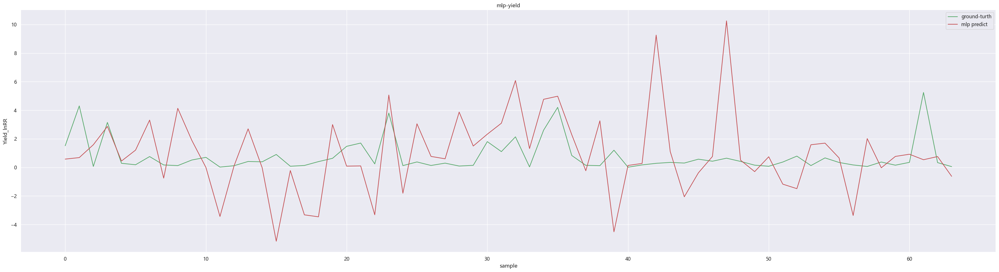

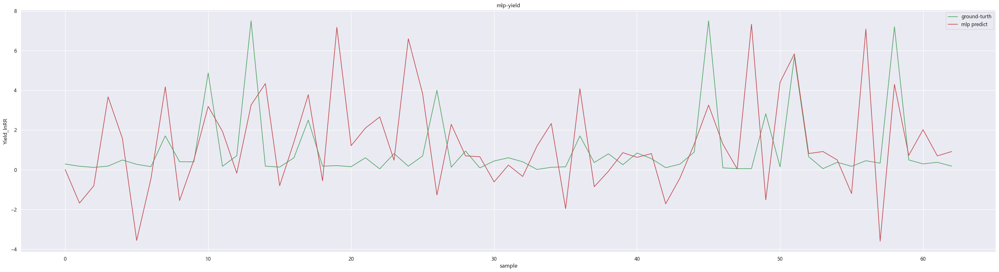

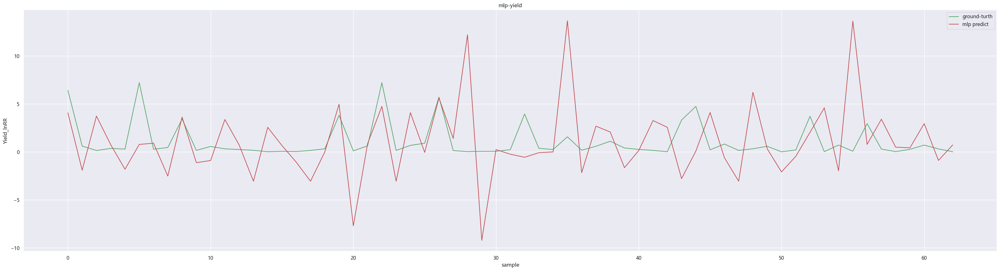

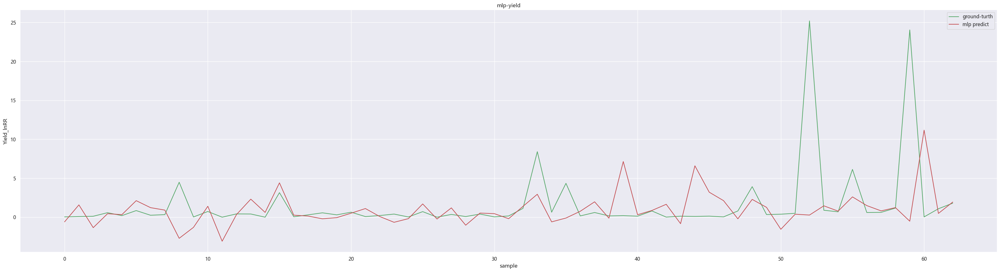

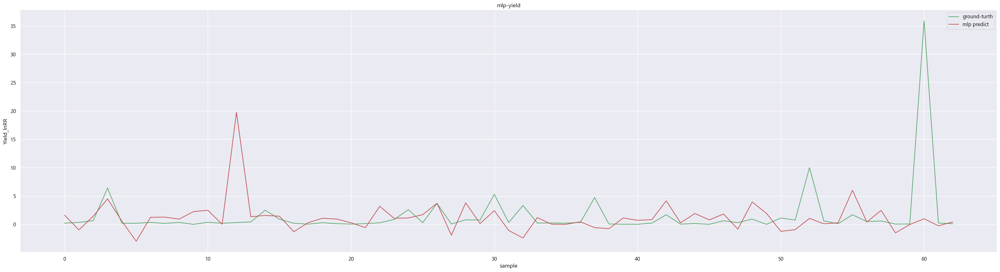

In [20]:
from sklearn.neural_network import MLPRegressor

mlp_model = MLPRegressor(solver='lbfgs',alpha=1e-5, hidden_layer_sizes=(40,40), max_iter=500, random_state=2023)
mlp_preds = np.zeros(X_train.shape[0])
logging.info('MLP Training --------------------------------------------------------------------------------------')

for train_index, valid_index in kf.split(X_train, y_train):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]

    mlp_model.fit(x_tr, y_tr)
    mlp_pred_valid = mlp_model.predict(x_va)
    mlp_preds[valid_index] = mlp_pred_valid

    logging.info('{}, {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the MLP is: {}'.format(metrics.mean_squared_error(y_va, mlp_pred_valid)))
    logging.info('Train: The mae of the MLP is: {}'.format(metrics.mean_absolute_error(y_va, mlp_pred_valid)))
    logging.info('Train: The R2 of the MLP is: {}'.format(metrics.r2_score(y_va, mlp_pred_valid)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, mlp_pred_valid, 'r', label='mlp predict')
    plt.legend(loc='best')
    plt.title('mlp-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

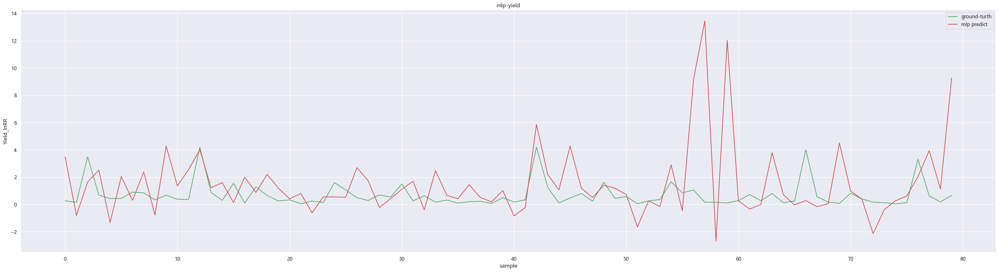

In [21]:
mlp_pred_test = mlp_model.predict(X_test)

logging.info('Test: The rmse of the MLP is: {}'.format(metrics.mean_squared_error(y_test, mlp_pred_test)))
logging.info('Test: The mae of the MLP is: {}'.format(metrics.mean_absolute_error(y_test, mlp_pred_test)))
logging.info('Test: The R2 of the MLP is: {}'.format(metrics.r2_score(y_test, mlp_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, mlp_pred_test, 'r', label='mlp predict')
plt.legend(loc='best')
plt.title('mlp-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(mlp_model, f'{model_save_file}/mlp_model.pkl')
result_mse['MLP(k)'] = metrics.mean_squared_error(y_test,mlp_pred_test)
result_mae['MLP(k)'] = metrics.mean_absolute_error(y_test,mlp_pred_test)
result_r2['MLP(k)'] = metrics.r2_score(y_test,mlp_pred_test)
logging.info('MLP Test Result: MSE: {}'.format(result_mse['MLP(k)']))
logging.info('MLP Test Result: MSE: {}'.format(result_mae['MLP(k)']))
logging.info('MLP Test Result: R2: {}'.format(result_r2['MLP(k)']))
logging.info('MLP Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': mlp_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/mlp_pred.csv', index=False)

#### SVR进行预测

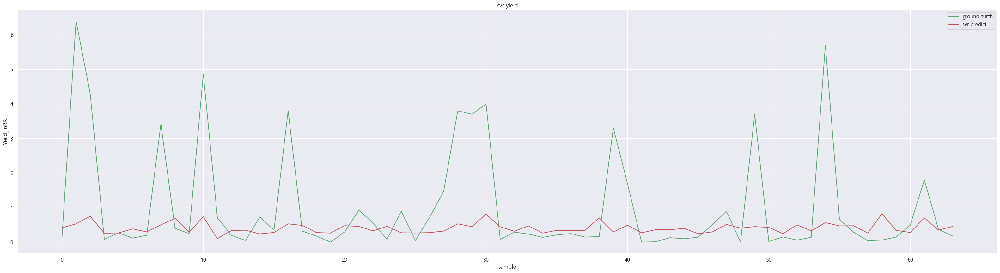

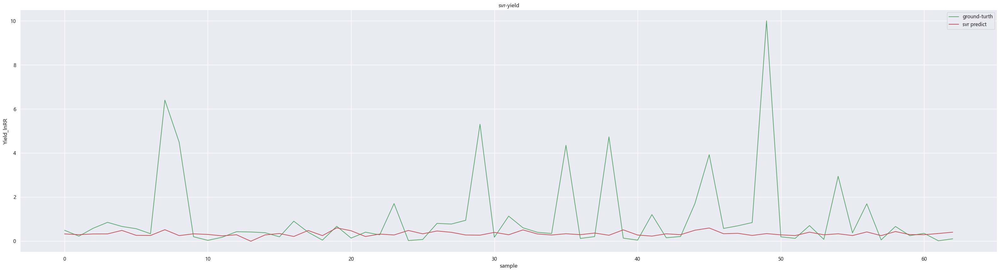

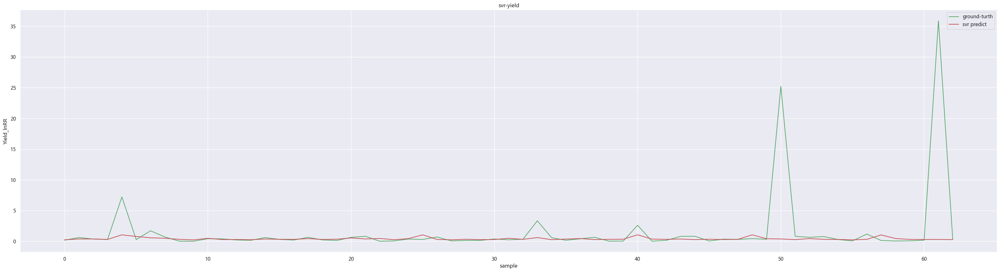

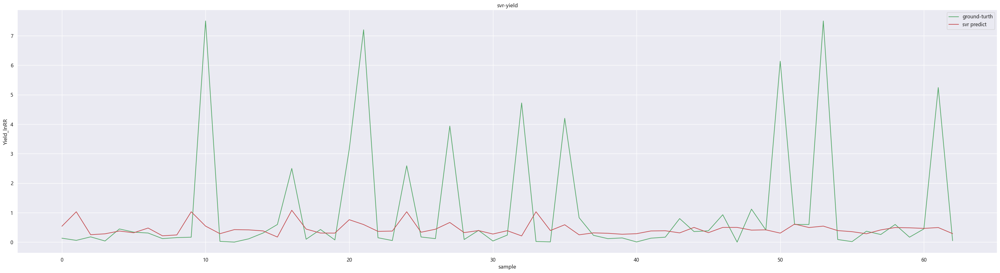

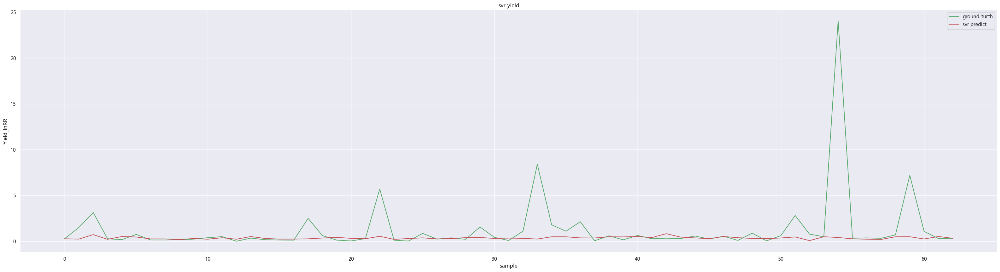

In [22]:
from sklearn.svm import SVR

svr_model = SVR(kernel ='rbf',
                degree = 3,
                coef0 = 0.0,
                tol = 0.001,
                C = 1.0,
                epsilon = 0.1,
                shrinking = True,
                cache_size = 200,
                verbose = False,
                max_iter = -1)

svr_preds = np.zeros(X_train.shape[0])
logging.info('SVR Training --------------------------------------------------------------------------------------')

for train_index, valid_index in kf.split(X_train, y_train):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]

    svr_model.fit(x_tr, y_tr)
    svr_pred_valid = svr_model.predict(x_va)
    svr_preds[valid_index] = svr_pred_valid

    logging.info('%s, %s', x_tr.shape, y_tr.shape)
    logging.info('Train: The rmse of the SVR is: %s', metrics.mean_squared_error(y_va, svr_pred_valid))
    logging.info('Train: The mae of the SVR is: %s', metrics.mean_absolute_error(y_va, svr_pred_valid))
    logging.info('Train: The R2 of the SVR is: %s', metrics.r2_score(y_va, svr_pred_valid))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, svr_pred_valid, 'r', label='svr predict')
    plt.legend(loc='best')
    plt.title('svr-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

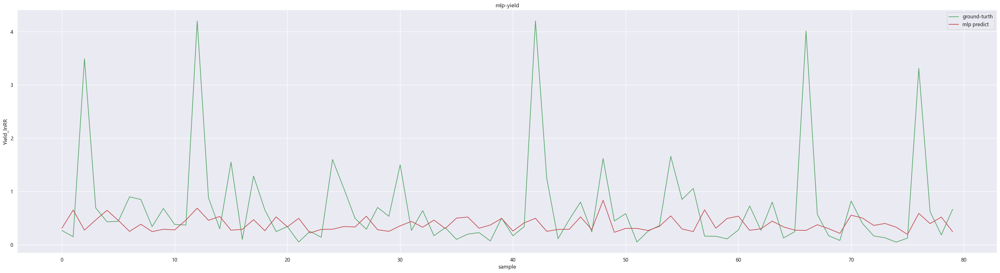

In [23]:
svr_pred_test = svr_model.predict(X_test)

logging.info('Test: The rmse of the SVR is: {}'.format(metrics.mean_squared_error(y_test,svr_pred_test)))
logging.info('Test: The mae of the SVR is: {}'.format(metrics.mean_absolute_error(y_test,svr_pred_test)))
logging.info('Test: The R2 of the SVR is: {}'.format(metrics.r2_score(y_test,svr_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, svr_pred_test, 'r', label='mlp predict')
plt.legend(loc='best')
plt.title('mlp-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(svr_model, f'{model_save_file}/svr_model.pkl')
result_mse['SVR(k)'] = metrics.mean_squared_error(y_test,svr_pred_test)
result_mse['SVR(k)'] = metrics.mean_squared_error(y_test,svr_pred_test)
result_mae['SVR(k)'] = metrics.mean_absolute_error(y_test,svr_pred_test)
result_r2['SVR(k)'] = metrics.r2_score(y_test,svr_pred_test)
logging.info('SVR Test Result: MSE: {}'.format(result_mse['SVR(k)']))
logging.info('SVR Test Result: MSE: {}'.format(result_mae['SVR(k)']))
logging.info('SVR Test Result: R2: {}'.format(result_r2['SVR(k)']))
logging.info('SVR Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': svr_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/svr_pred.csv', index=False)

#### 使用GAUSS Rgression进行预测

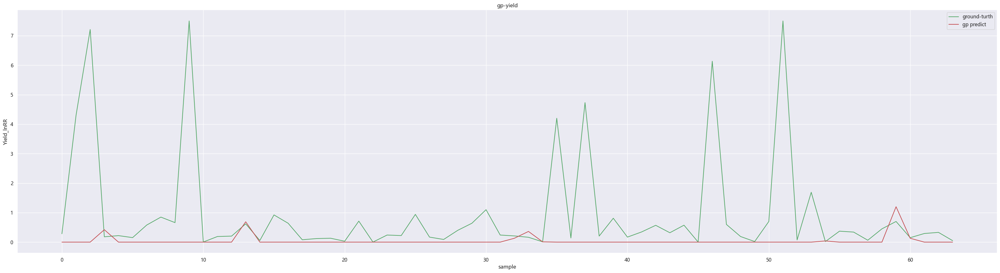

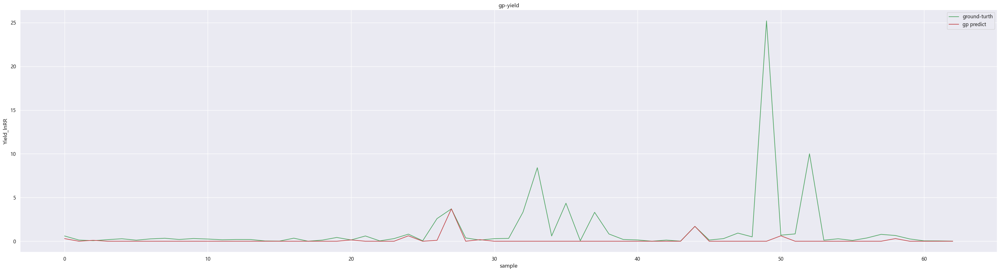

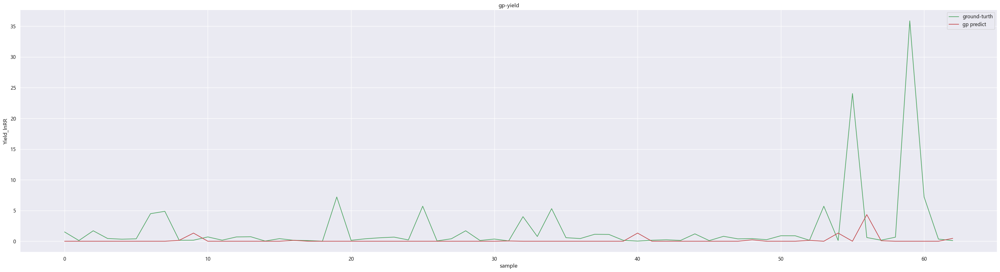

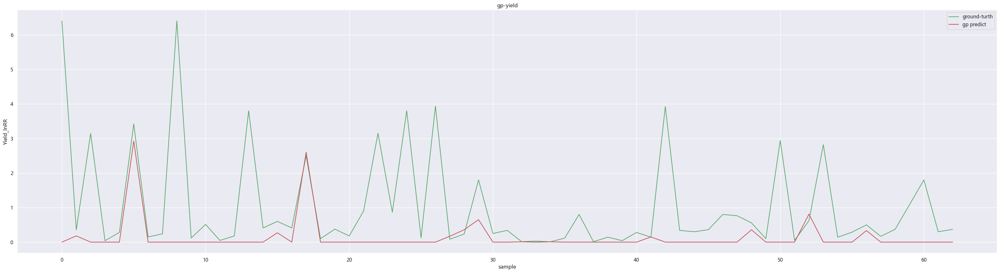

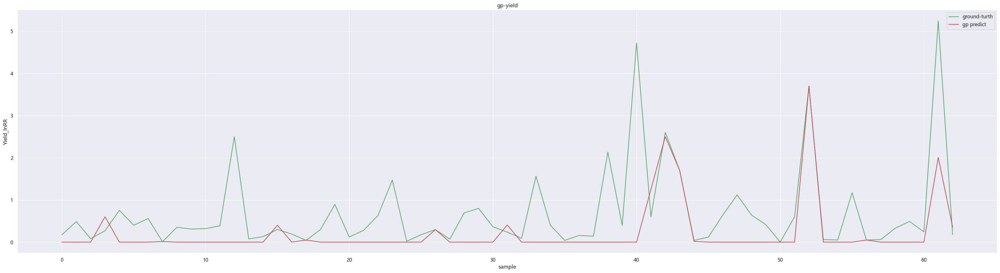

In [24]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

# 创建高斯过程回归模型对象
gp_model = GaussianProcessRegressor(kernel=RBF())

gp_preds = np.zeros(X_train.shape[0])
logging.info('GaussR Training --------------------------------------------------------------------------------------')

for train_index, valid_index in kf.split(X_train, y_train):
    x_tr, x_va = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_tr, y_va = y_train.iloc[train_index], y_train.iloc[valid_index]

    gp_model.fit(x_tr, y_tr)
    gp_pred_valid = gp_model.predict(x_va)
    gp_preds[valid_index] = gp_pred_valid

    logging.info('{}, {}'.format(x_tr.shape, y_tr.shape))
    logging.info('Train: The rmse of the GaussR is: {}'.format(metrics.mean_squared_error(y_va, gp_pred_valid)))
    logging.info('Train: The mae of the GaussR is: {}'.format(metrics.mean_absolute_error(y_va, gp_pred_valid)))
    logging.info('Train: The R2 of the GaussR is: {}'.format(metrics.r2_score(y_va, gp_pred_valid)))

    x = list(range(0, len(y_va)))
    plt.figure(figsize=(40,10))
    plt.plot(x, y_va, 'g', label='ground-turth')
    plt.plot(x, gp_pred_valid, 'r', label='gp predict')
    plt.legend(loc='best')
    plt.title('gp-yield')
    plt.xlabel('sample')
    plt.ylabel('Yield_lnRR')
    plt.show()

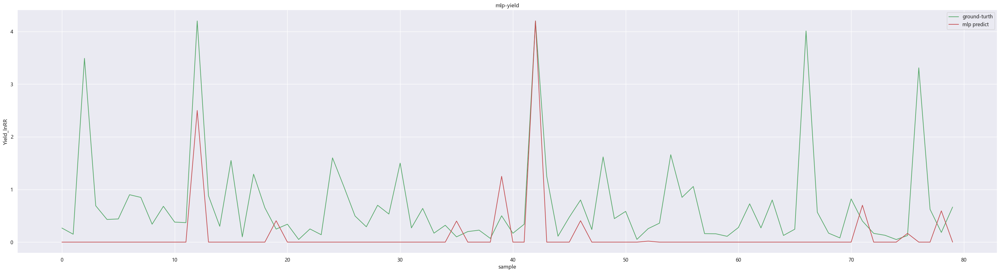

In [25]:
gp_pred_test = gp_model.predict(X_test)

logging.info('Test: The rmse of the GaussR is: {}'.format(metrics.mean_squared_error(y_test,gp_pred_test)))
logging.info('Test: The mae of the GaussR is: {}'.format(metrics.mean_absolute_error(y_test,gp_pred_test)))
logging.info('Test: The R2 of the GaussR is: {}'.format(metrics.r2_score(y_test,gp_pred_test)))

x = list(range(0, len(y_test)))
plt.figure(figsize=(40,10))
plt.plot(x, y_test, 'g', label='ground-turth')
plt.plot(x, gp_pred_test, 'r', label='mlp predict')
plt.legend(loc='best')
plt.title('mlp-yield')
plt.xlabel('sample')
plt.ylabel('Yield_lnRR')
plt.show()

joblib.dump(gp_model, f'{model_save_file}/gp_model.pkl')
result_mse['GaussR(k)'] = metrics.mean_squared_error(y_test,gp_pred_test)
result_mse['GaussR(k)'] = metrics.mean_squared_error(y_test,gp_pred_test)
result_mae['GaussR(k)'] = metrics.mean_absolute_error(y_test,gp_pred_test)
result_r2['GaussR(k)'] = metrics.r2_score(y_test,gp_pred_test)
logging.info('GaussR Test Result: MSE: {}'.format(result_mse['GaussR(k)']))
logging.info('GaussR Test Result: MSE: {}'.format(result_mae['GaussR(k)']))
logging.info('GaussR Test Result: R2: {}'.format(result_r2['GaussR(k)']))
logging.info('GaussR Training End--------------------------------------------------------------------------------------')

df_tmp = pd.DataFrame({'pred': gp_pred_test, 'true': y_test})
df_tmp.to_csv(f'{model_save_file}/gaussr_pred.csv', index=False)

### 不同模型的效果比对分析（RMSE指标）

In [26]:
import json

# 将字典保存为 JSON 文件
with open(mse_json, 'w') as json_file:
    json.dump(result_mse, json_file)
with open(mae_json, 'w') as json_file:
    json.dump(result_mae, json_file)
with open(r2_json, 'w') as json_file:
    json.dump(result_r2, json_file)

In [27]:
# import plotly.express as px
# import plotly.io as pio

# with open(model_performance_json, 'r') as json_file:
#     result_mse = json.load(json_file)
    
# result_mse = dict(sorted(result_mse.items(), key=lambda item: item[1]))
# categories = list(result_mse.keys())
# values = list(result_mse.values())

# color_mapping = {}
# for k, v in result_mse.items():
#     if v < 0.4:
#         color_mapping[k] = "Tree-Base"
#     else:
#         color_mapping[k] = "Other"
    
# # 创建柱状图
# fig = px.bar(x=categories, y=values, title=f'Models Performance in {target}', color=color_mapping)
# fig.update_layout(template="seaborn")
# # 显示图表
# fig.show()
# # 保存柱状图为 HTML 文件
# pio.write_html(fig, file=model_performance_path)  

### 挑选合适的模型进行进一步的变量分析(Tree-Base)

In [28]:
import shap
shap.initjs()

#### 变量重要性分析

##### RF模型分析--变量重要性分析

In [29]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns

temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), width=800))
colors=px.colors.qualitative.Plotly

feat_importance=pd.DataFrame()
feat_importance["Importance"]=rf_model.feature_importances_
feat_importance.set_index(X_train.columns, inplace=True)

feat_importance = feat_importance.sort_values(by='Importance',ascending=True)
pal=sns.color_palette("plasma_r", 70).as_hex()[2:]

fig=go.Figure()
for i in range(len(feat_importance.index)):
    fig.add_shape(dict(type="line", y0=i, y1=i, x0=0, x1=feat_importance['Importance'][i], 
                       line_color=pal[::-1][i],opacity=0.7,line_width=4))
fig.add_trace(go.Scatter(x=feat_importance['Importance'], y=feat_importance.index, mode='markers', 
                         marker_color=pal[::-1], marker_size=8,
                         hovertemplate='%{y} Importance = %{x:.5f}<extra></extra>'))
fig.update_layout(template=temp,title='Overall Feature Importance', 
                  xaxis=dict(title='Average Importance',zeroline=False),
                  yaxis_showgrid=False, margin=dict(l=120,t=80),
                  height=700, width=800)
fig.show()

##### Xgboost

In [30]:
feat_importance=pd.DataFrame()
feat_importance["Importance"]=xgb_model.feature_importances_
feat_importance.set_index(X_train.columns, inplace=True)

feat_importance = feat_importance.sort_values(by='Importance',ascending=True)
pal=sns.color_palette("plasma_r", 70).as_hex()[2:]

fig=go.Figure()
for i in range(len(feat_importance.index)):
    fig.add_shape(dict(type="line", y0=i, y1=i, x0=0, x1=feat_importance['Importance'][i], 
                       line_color=pal[::-1][i],opacity=0.7,line_width=4))
fig.add_trace(go.Scatter(x=feat_importance['Importance'], y=feat_importance.index, mode='markers', 
                         marker_color=pal[::-1], marker_size=8,
                         hovertemplate='%{y} Importance = %{x:.5f}<extra></extra>'))
fig.update_layout(template=temp,title='Overall Feature Importance', 
                  xaxis=dict(title='Average Importance',zeroline=False),
                  yaxis_showgrid=False, margin=dict(l=120,t=80),
                  height=700, width=800)
fig.show()

##### Catboost

In [31]:
feat_importance=pd.DataFrame()
feat_importance["Importance"]=ctb_model.feature_importances_
feat_importance.set_index(X_train.columns, inplace=True)

feat_importance = feat_importance.sort_values(by='Importance',ascending=True)
pal=sns.color_palette("plasma_r", 70).as_hex()[2:]

fig=go.Figure()
for i in range(len(feat_importance.index)):
    fig.add_shape(dict(type="line", y0=i, y1=i, x0=0, x1=feat_importance['Importance'][i], 
                       line_color=pal[::-1][i],opacity=0.7,line_width=4))
fig.add_trace(go.Scatter(x=feat_importance['Importance'], y=feat_importance.index, mode='markers', 
                         marker_color=pal[::-1], marker_size=8,
                         hovertemplate='%{y} Importance = %{x:.5f}<extra></extra>'))
fig.update_layout(template=temp,title='Overall Feature Importance', 
                  xaxis=dict(title='Average Importance',zeroline=False),
                  yaxis_showgrid=False, margin=dict(l=120,t=80),
                  height=700, width=800)
fig.show()

##### Lightbgm

In [32]:
feat_importance=pd.DataFrame()
feat_importance["Importance"]=lgb_model.feature_importances_
feat_importance.set_index(X_train.columns, inplace=True)

feat_importance = feat_importance.sort_values(by='Importance',ascending=True)
pal=sns.color_palette("plasma_r", 70).as_hex()[2:]

fig=go.Figure()
for i in range(len(feat_importance.index)):
    fig.add_shape(dict(type="line", y0=i, y1=i, x0=0, x1=feat_importance['Importance'][i], 
                       line_color=pal[::-1][i],opacity=0.7,line_width=4))
fig.add_trace(go.Scatter(x=feat_importance['Importance'], y=feat_importance.index, mode='markers', 
                         marker_color=pal[::-1], marker_size=8,
                         hovertemplate='%{y} Importance = %{x:.5f}<extra></extra>'))
fig.update_layout(template=temp,title='Overall Feature Importance', 
                  xaxis=dict(title='Average Importance',zeroline=False),
                  yaxis_showgrid=False, margin=dict(l=120,t=80),
                  height=700, width=800)
fig.show()

#### 最优模型

In [33]:
# 读取 JSON 文件
file_path = f'output\TN_NH3_N2O_TC loss_CH4-C loss_CO2-C loss\\result_r2_{target}.json'
with open(file_path, 'r') as f:
    data = json.load(f)

# 找出最高 R2 分数对应的模型名称
best_model = max(data, key=lambda k: data[k])

# 输出最好的模型名称和对应的 R2 分数
print("最好的模型：", best_model)
print("R2 分数：", data[best_model])
print(target)
print(data)

最好的模型： SVR(k)
R2 分数： -0.09329129684092652
CH4-C loss (%)
{'RandomForest(k)': -4.187438354225617, 'XGBoost(k)': -2.653166072226652, 'Lightgbm(k)': -5.86835531725158, 'CatRegression(k)': -0.7226385994363635, 'RidgeRegression(k)': -0.49169940246152666, 'LinearRegression(k)': -1.1214106058803397, 'MLP(k)': -8.65805330573507, 'SVR(k)': -0.09329129684092652, 'GaussR(k)': -0.10820395305303476}


##### 做字典

In [34]:
# 给定的键
keys = ["RandomForest(k)", "XGBoost(k)", "Lightgbm(k)", "CatRegression(k)", 
        "RidgeRegression(k)", "LinearRegression(k)", "MLP(k)", "SVR(k)", "GaussR(k)"]

# 给定的模型名称
models_str = ["rf_model", "xgb_model", "lgb_model", "ctb_model", 
          "ri_model", "lr_model", "mlp_model", "svr_model", "gp_model"]

models = [rf_model, xgb_model, lgb_model, ctb_model, ri_model, lr_model, mlp_model, svr_model, gp_model]


# 构建字典
model_dict = {key: model for key, model in zip(keys, models)}
model_dict_str = {key: model for key, model in zip(keys, models_str)}

# 输出结果
print(model_dict_str)

{'RandomForest(k)': 'rf_model', 'XGBoost(k)': 'xgb_model', 'Lightgbm(k)': 'lgb_model', 'CatRegression(k)': 'ctb_model', 'RidgeRegression(k)': 'ri_model', 'LinearRegression(k)': 'lr_model', 'MLP(k)': 'mlp_model', 'SVR(k)': 'svr_model', 'GaussR(k)': 'gp_model'}


选择最优模型

In [35]:
shap_model = model_dict[best_model]

#### 遗传算法

In [36]:
# CSV 文件路径
csv_file =data_path
print(data_path)
# 用于存储输入特征和输出特征的列表
input_features_list = []
output_feature_list = []
model_names = []


# 从文件路径中提取模型名称
model_name = os.path.splitext(os.path.basename(csv_file))[0]
model_names.append(model_name)

# 读取 CSV 文件
df = pd.read_csv(csv_file)

# 获取输入特征（除了最后一列）和输出特征（最后一列）的列名，并添加到列表中
input_features = list(df.columns[:-1])
output_feature = df.columns[-1]
input_features_list.append(input_features)
output_feature_list.append(output_feature)

# 打印模型名称、输入特征和输出特征的列表
for model_name, input_features, output_feature in zip(model_names, input_features_list, output_feature_list):
    print("模型名称:", best_model)
    print("输入特征:", input_features)
    print("输出特征:", output_feature)


data/TN_NH3_N2O_TC loss_CH4-C loss_CO2-C loss/data_for_CH4-C loss (%).csv
模型名称: SVR(k)
输入特征: ['material_0', 'initial TN(%)', 'initial TC(%)', 'initial moisture content(%)', 'initial CN(%)', 'initial pH', 'material_1', 'Excipients_1', 'Additive Species']
输出特征: CH4-C loss (%)


In [37]:
# 存储所有输入特征和标签的最小值和最大值的字典
min_max_values = {}


# 获取输入特征的列名（去除最后一列）
input_features = list(df.columns[:-1])
# 获取标签的列名
label_column = df.columns[-1]

# 遍历每个输入特征
for feature in input_features:
    # 如果特征不存在，创建新的特征项
    if feature not in min_max_values:
        min_max_values[feature] = {'Minimum': None, 'Maximum': None}
    # 计算输入特征的最小值和最大值，并更新字典中的值
    if min_max_values[feature]['Minimum'] is None:
        min_max_values[feature]['Minimum'] = round(df[feature].min(), 2)
    else:
        min_max_values[feature]['Minimum'] = min(round(min_max_values[feature]['Minimum'], 2), round(df[feature].min(), 2))
    if min_max_values[feature]['Maximum'] is None:
        min_max_values[feature]['Maximum'] = round(df[feature].max(), 2)
    else:
        min_max_values[feature]['Maximum'] = max(round(min_max_values[feature]['Maximum'], 2), round(df[feature].max(), 2))

# 如果标签不存在，创建新的标签项
if label_column not in min_max_values:
    min_max_values[label_column] = {'Minimum': None, 'Maximum': None}
# 计算标签的最小值和最大值，并更新字典中的值
if min_max_values[label_column]['Minimum'] is None:
    min_max_values[label_column]['Minimum'] = round(df[label_column].min(), 2)
else:
    min_max_values[label_column]['Minimum'] = min(round(min_max_values[label_column]['Minimum'], 2), round(df[label_column].min(), 2))
if min_max_values[label_column]['Maximum'] is None:
    min_max_values[label_column]['Maximum'] = round(df[label_column].max(), 2)
else:
    min_max_values[label_column]['Maximum'] = max(round(min_max_values[label_column]['Maximum'], 2), round(df[label_column].max(), 2))

# 打印每个输入特征和标签的最小值和最大值
for category, stats in min_max_values.items():
    print(f"{category}: Minimum={stats['Minimum']}, Maximum={stats['Maximum']}")

    print(min_max_values)


material_0: Minimum=0, Maximum=5
{'material_0': {'Minimum': 0, 'Maximum': 5}, 'initial TN(%)': {'Minimum': -1.0, 'Maximum': 11.58}, 'initial TC(%)': {'Minimum': -1.0, 'Maximum': 197.0}, 'initial moisture content(%)': {'Minimum': -1.0, 'Maximum': 88.5}, 'initial CN(%)': {'Minimum': -1.0, 'Maximum': 55.98}, 'initial pH': {'Minimum': -1.0, 'Maximum': 10.7}, 'material_1': {'Minimum': 0, 'Maximum': 10}, 'Excipients_1': {'Minimum': 0, 'Maximum': 27}, 'Additive Species': {'Minimum': 0, 'Maximum': 4}, 'CH4-C loss (%)': {'Minimum': 0.0, 'Maximum': 35.87}}
initial TN(%): Minimum=-1.0, Maximum=11.58
{'material_0': {'Minimum': 0, 'Maximum': 5}, 'initial TN(%)': {'Minimum': -1.0, 'Maximum': 11.58}, 'initial TC(%)': {'Minimum': -1.0, 'Maximum': 197.0}, 'initial moisture content(%)': {'Minimum': -1.0, 'Maximum': 88.5}, 'initial CN(%)': {'Minimum': -1.0, 'Maximum': 55.98}, 'initial pH': {'Minimum': -1.0, 'Maximum': 10.7}, 'material_1': {'Minimum': 0, 'Maximum': 10}, 'Excipients_1': {'Minimum': 0, 'Max

In [38]:
# 假设loaded_models已经定义，用于存储加载的模型
# loaded_models = load_models() # 这里是你加载模型的代码，假设已经定义了
loaded_model_1 = shap_model

# 创建输入范围字典和输出范围字典
input_ranges_1 = {key: value for key, value in min_max_values.items() if key not in labels}
output_range_1 = {key: value for key, value in min_max_values.items() if key in labels}

print("Input Ranges:")
print(input_ranges_1)
print("\nOutput Ranges:")
print(output_range_1)

# 创建属性名称到数值的映射
attribute_mapping = {key: idx for idx, key in enumerate(input_ranges_1.keys())}

# 最小化目标函数
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

toolbox = base.Toolbox()

# 定义生成整数属性的方法
toolbox.register("attr_int", lambda minimum, maximum: random.randint(round(minimum), round(maximum)))

# 定义生成浮点数属性的方法
toolbox.register("attr_float", lambda minimum, maximum: random.uniform(minimum, maximum))

# 创建个体时根据属性类型选择不同的生成方法
def create_individual():
    individual = []
    for attr_name, attr_info in input_ranges_1.items():
        if attr_name in ['material_0', 'material_1', 'Excipients', 'Additive Species']:
            individual.append(toolbox.attr_int(attr_info['Minimum'], attr_info['Maximum']))
        else:
            individual.append(toolbox.attr_float(attr_info['Minimum'], attr_info['Maximum']))
    return creator.Individual(individual)

# 注册个体生成方法
toolbox.register("individual", create_individual)

# 初始化种群
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

def evaluate(individual):
    # 使用模型进行预测
    individual_with_names = {attr_name: value for attr_name, value in zip(input_ranges_1.keys(), individual)}

    # 检查每个特征值是否超出范围，如果超出范围则返回一个非常大的适应度值
    for key, value in individual_with_names.items():
        if key in ['material_0', 'material_1', 'Excipients', 'Additive Species']:
            if not isinstance(value, int) or value < input_ranges_1[key]['Minimum'] or value > input_ranges_1[key]['Maximum']:
                return (1e6,)  # 返回一个非常大的适应度值，表示不合法的个体
        else:
            if value < input_ranges_1[key]['Minimum'] or value > input_ranges_1[key]['Maximum']:
                return (1e6,)  # 返回一个非常大的适应度值，表示不合法的个体

    # 使用模型进行预测
    prediction = loaded_model_1.predict([individual])

    # 计算模型输出并返回其负值作为适应度（因为我们是最小化问题）
    fitness = -prediction
    return fitness,

toolbox.register("evaluate", evaluate)
toolbox.register("mate", tools.cxBlend, alpha=0.5)  # 交叉方式使用 Blend 交叉
# toolbox.register("mate", tools.cxOnePoint)

toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)  # 变异方式使用高斯变异
toolbox.register("select", tools.selTournament, tournsize=3)

# 进化算法
def main(population_size=100, n_generations=50, cxpb=0.5, mutpb=0.2):
    pop = toolbox.population(n=population_size)
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("min", min)

    algorithms.eaSimple(pop, toolbox, cxpb=cxpb, mutpb=mutpb, ngen=n_generations, stats=stats, halloffame=hof, verbose=False)

    return pop, stats, hof

# 调整参数
population_size = 200
n_generations = 100
cxpb = 0.5  # 交叉概率
mutpb = 0.01  # 变异概率

num_runs = 100  # 运行次数
best_individuals = []

for i in range(num_runs):
    pop, stats, hof = main(population_size, n_generations, cxpb, mutpb)
    best_individual = tools.selBest(pop, 1)[0]
    print(f"Run {i+1}: Best individual with fitness {best_individual.fitness.values[0]}")
    best_individual_with_names = {list(input_ranges_1.keys())[idx]: value for idx, value in enumerate(best_individual)}
    best_individuals.append((best_individual, best_individual_with_names))

# 保存最优个体到CSV文件
file_name = f"best_individuals_{target}.csv"
data = []
columns = list(input_ranges_1.keys()) + [target]
for best_individual, best_individual_with_names in best_individuals:
    row = [best_individual_with_names[attr] for attr in input_ranges_1.keys()]
    row.append(-best_individual.fitness.values[0])  # 添加适应度值
    data.append(row)

df = pd.DataFrame(data, columns=columns)
df.to_csv(file_name, index=False)

print(f"Best individuals saved to_{target}:", file_name)

Input Ranges:
{'material_0': {'Minimum': 0, 'Maximum': 5}, 'initial TN(%)': {'Minimum': -1.0, 'Maximum': 11.58}, 'initial TC(%)': {'Minimum': -1.0, 'Maximum': 197.0}, 'initial moisture content(%)': {'Minimum': -1.0, 'Maximum': 88.5}, 'initial CN(%)': {'Minimum': -1.0, 'Maximum': 55.98}, 'initial pH': {'Minimum': -1.0, 'Maximum': 10.7}, 'material_1': {'Minimum': 0, 'Maximum': 10}, 'Excipients_1': {'Minimum': 0, 'Maximum': 27}, 'Additive Species': {'Minimum': 0, 'Maximum': 4}}

Output Ranges:
{'CH4-C loss (%)': {'Minimum': 0.0, 'Maximum': 35.87}}


Run 1: Best individual with fitness [-0.85263924]


Run 2: Best individual with fitness [-0.85398534]


Run 3: Best individual with fitness [-0.96251302]


Run 4: Best individual with fitness [-0.98199598]


Run 5: Best individual with fitness [-0.87540132]


Run 6: Best individual with fitness [-0.93523846]


Run 7: Best individual with fitness [-0.92668451]


Run 8: Best individual with fitness [-0.98189006]


Run 9: Best individual with fitness [-0.94267488]


Run 10: Best individual with fitness [-0.95693025]


Run 11: Best individual with fitness [-0.91909281]


Run 12: Best individual with fitness [-1.03819274]


Run 13: Best individual with fitness [-1.01464169]


Run 14: Best individual with fitness [-1.03383221]


Run 15: Best individual with fitness [-1.03145359]


Run 16: Best individual with fitness [-0.83675219]


Run 17: Best individual with fitness [-0.91063884]


Run 18: Best individual with fitness [-0.97610856]


Run 19: Best individual with fitness [-0.98072155]


Run 20: Best individual with fitness [-0.98250879]


Run 21: Best individual with fitness [-0.90309263]


Run 22: Best individual with fitness [-0.9234407]


Run 23: Best individual with fitness [-0.94342959]


Run 24: Best individual with fitness [-1.00122129]


Run 25: Best individual with fitness [-0.96221796]


Run 26: Best individual with fitness [-1.0011279]


Run 27: Best individual with fitness [-0.90654164]


Run 28: Best individual with fitness [-1.06467448]


Run 29: Best individual with fitness [-0.94491841]


Run 30: Best individual with fitness [-0.97643872]


Run 31: Best individual with fitness [-0.9910549]


Run 32: Best individual with fitness [-0.9659937]


Run 33: Best individual with fitness [-0.88348914]


Run 34: Best individual with fitness [-0.88365115]


Run 35: Best individual with fitness [-1.01610291]


Run 36: Best individual with fitness [-0.89620665]


Run 37: Best individual with fitness [-0.9664021]


Run 38: Best individual with fitness [-0.9155135]


Run 39: Best individual with fitness [-0.91983946]


Run 40: Best individual with fitness [-0.84979106]


Run 41: Best individual with fitness [-1.00749547]


Run 42: Best individual with fitness [-0.92095637]


Run 43: Best individual with fitness [-1.01367341]


Run 44: Best individual with fitness [-0.90132131]


Run 45: Best individual with fitness [-1.07308136]


Run 46: Best individual with fitness [-1.03678713]


Run 47: Best individual with fitness [-0.892172]


Run 48: Best individual with fitness [-0.93250768]


Run 49: Best individual with fitness [-0.97479596]


Run 50: Best individual with fitness [-0.94528802]


Run 51: Best individual with fitness [-1.01027952]


Run 52: Best individual with fitness [-1.0262356]


Run 53: Best individual with fitness [-0.98308035]


Run 54: Best individual with fitness [-0.86513508]


Run 55: Best individual with fitness [-0.86904048]


Run 56: Best individual with fitness [-1.06806501]


Run 57: Best individual with fitness [-1.00343503]


Run 58: Best individual with fitness [-0.94544911]


Run 59: Best individual with fitness [-0.81467925]


Run 60: Best individual with fitness [-0.87428808]


Run 61: Best individual with fitness [-0.92331559]


Run 62: Best individual with fitness [-0.91211178]


Run 63: Best individual with fitness [-0.91238649]


Run 64: Best individual with fitness [-0.83272837]


Run 65: Best individual with fitness [-0.89896552]


Run 66: Best individual with fitness [-0.95849385]


Run 67: Best individual with fitness [-0.96194081]


Run 68: Best individual with fitness [-0.92104828]


Run 69: Best individual with fitness [-0.92338372]


Run 70: Best individual with fitness [-0.99106351]


Run 71: Best individual with fitness [-0.93633215]


Run 72: Best individual with fitness [-0.89330331]


Run 73: Best individual with fitness [-0.85112554]


Run 74: Best individual with fitness [-1.00118021]


Run 75: Best individual with fitness [-0.94927309]


Run 76: Best individual with fitness [-0.98251266]


Run 77: Best individual with fitness [-0.88272936]


Run 78: Best individual with fitness [-1.03015212]


Run 79: Best individual with fitness [-1.05827899]


Run 80: Best individual with fitness [-0.99914433]


Run 81: Best individual with fitness [-0.9690425]


Run 82: Best individual with fitness [-0.94437321]


Run 83: Best individual with fitness [-0.91609997]


Run 84: Best individual with fitness [-0.87611354]


Run 85: Best individual with fitness [-0.91910192]


Run 86: Best individual with fitness [-0.91966311]


Run 87: Best individual with fitness [-0.8935045]


Run 88: Best individual with fitness [-1.03463878]


Run 89: Best individual with fitness [-0.94726414]


Run 90: Best individual with fitness [-0.92805465]


Run 91: Best individual with fitness [-0.93224301]


Run 92: Best individual with fitness [-1.00794519]


Run 93: Best individual with fitness [-0.97625934]


Run 94: Best individual with fitness [-1.01546279]


Run 95: Best individual with fitness [-1.00193218]


Run 96: Best individual with fitness [-1.00530173]


Run 97: Best individual with fitness [-0.9462667]


Run 98: Best individual with fitness [-0.89601337]


Run 99: Best individual with fitness [-0.97356194]


Run 100: Best individual with fitness [-0.9824774]
Best individuals saved to_CH4-C loss (%): best_individuals_CH4-C loss (%).csv


从最优个体找出最小

In [39]:
# 从保存的文件中找到标题为"N2O-N loss (%)"的最小值对应的组合
min_loss_combinations = []
min_loss = min(df[target])
for index, row in df.iterrows():
    if row[target] == min_loss:
        min_loss_combinations.append(row)

print(f"\nCombinations with minimum {target} ({min_loss}%):")
for combination in min_loss_combinations:
    print(combination)


Combinations with minimum CH4-C loss (%) ([0.81467925]%):
material_0                                       4
initial TN(%)                             3.308826
initial TC(%)                           179.503268
initial moisture content(%)                8.92578
initial CN(%)                            55.116416
initial pH                                 6.74866
material_1                                       0
Excipients_1                              9.575889
Additive Species                                 0
CH4-C loss (%)                 [0.814679251436684]
Name: 58, dtype: object


### SHAP值分析（LGB为例）

SHAP是由Shapley value启发的可加性解释模型。对于每个预测样本，模型都产生一个预测值，SHAP value就是该样本中每个特征所分配到的数值。 
很明显可以看出，与上一节中feature importance相比，SHAP value最大的优势是SHAP能对于反映出每一个样本中的特征的影响力，而且还表现出影响的正负性。

#### 特殊处理

  0%|          | 0/316 [00:00<?, ?it/s]

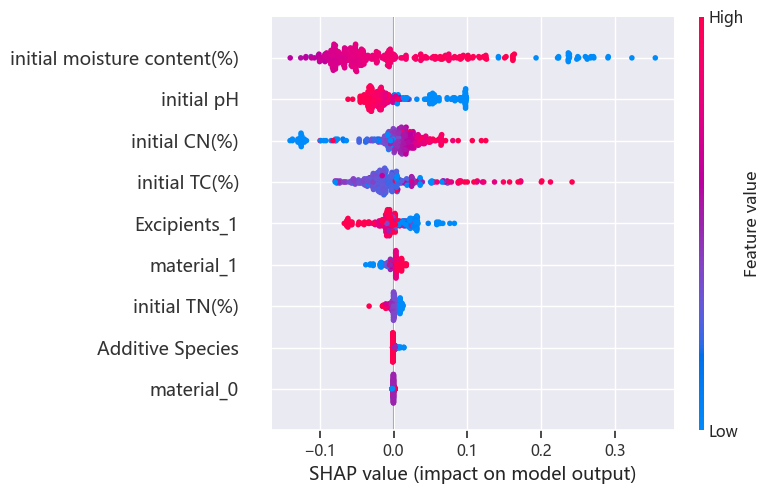

In [40]:
if best_model == 'SVR(k)' or best_model == "MLP(k)" or best_model == 'GaussR(k)':

    # 假设您已经有了SVR模型 svr_model 和数据集 X_train
    # 注意：您需要确保您的SVR模型 svr_model 是可调用的，并且接受特征数据作为输入

    # 初始化Kernel SHAP解释器，并指定使用GPU加速计算
    explainer = shap.KernelExplainer(shap_model.predict, X_train, gpu=True)

    # 计算SHAP值矩阵
    shap_values = explainer.shap_values(X_train)
    
    # 设置大一点的图表尺寸
    plt.figure(figsize=(12, 8))

    # 调整图表布局，确保图形元素不会相互重叠
    plt.tight_layout()

    # 可视化解释结果
    shap.summary_plot(shap_values, X_train, show=False)


    # 保存结果为图片文件
    plt.savefig(f'output/{target}_shap/svr_model_sv_all.png', format='png')
    plt.show()
    
    lgb_explainer = explainer
    lgb_shap_values = shap_values

进行分析

In [41]:
if not (best_model == 'SVR(k)' or best_model == "MLP(k)" or best_model == 'GaussR(k)'):
    # 获取feature importance
    plt.figure(figsize=(12, 8))

    # 调整图表布局，确保图形元素不会相互重叠
    plt.tight_layout()
    # result_r2_N2O-N loss  (%)  xgb_model
    # CH4-C loss (%) ctb_model
    # CO2-C loss  (%) ctb_model
    # NH3-N loss  (%) ctb_model
    # TC loss  (%) lgb_model
    # TN loss  (%) rf_model
    feat_importance=pd.DataFrame()
    feat_importance["Importance"]=shap_model.feature_importances_
    feat_importance.set_index(X_train.columns, inplace=True)

    feat_importance = feat_importance.sort_values(by='Importance', ascending=False)

    plt.bar(range(len(X_train.columns)), feat_importance['Importance'])
    plt.xticks(range(len(X_train.columns)), feat_importance.index, rotation=90, fontsize=14)
    plt.title('Feature importance', fontsize=14)
    # 保存结果为图片文件
    plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_FI.png', format='png')
    plt.show()


In [42]:
if not (best_model == 'SVR(k)' or best_model == "MLP(k)" or best_model == 'GaussR(k)'):

    lgb_explainer = shap.TreeExplainer(shap_model)
    lgb_shap_values = lgb_explainer.shap_values(X_train)
    print(lgb_shap_values.shape)

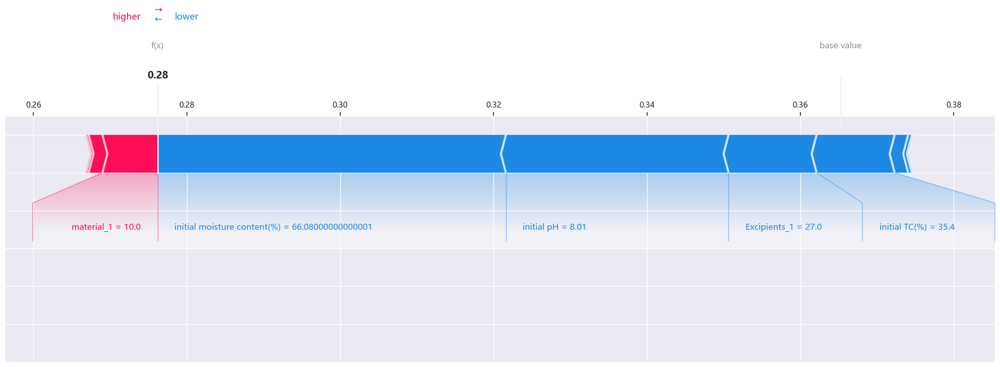

In [43]:
# 假设您已经生成了 lgb_explainer 和 lgb_shap_values

# 生成SHAP力图
shap.force_plot(lgb_explainer.expected_value, lgb_shap_values[0,:], X_train.iloc[0,:], matplotlib=True, show=False )

# 访问当前的Matplotlib图形
fig = plt.gcf()

# 调整图表尺寸
fig.set_size_inches(20, 8)

# 将图形的背景色设置为白色（或其他所需颜色）
fig.patch.set_facecolor('white')

# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

# 保存结果为图片文件
plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_e1.png', format='png')


# 显示图形
plt.show()


对第一个实例的特征贡献图也可用 waterfall 方式展示

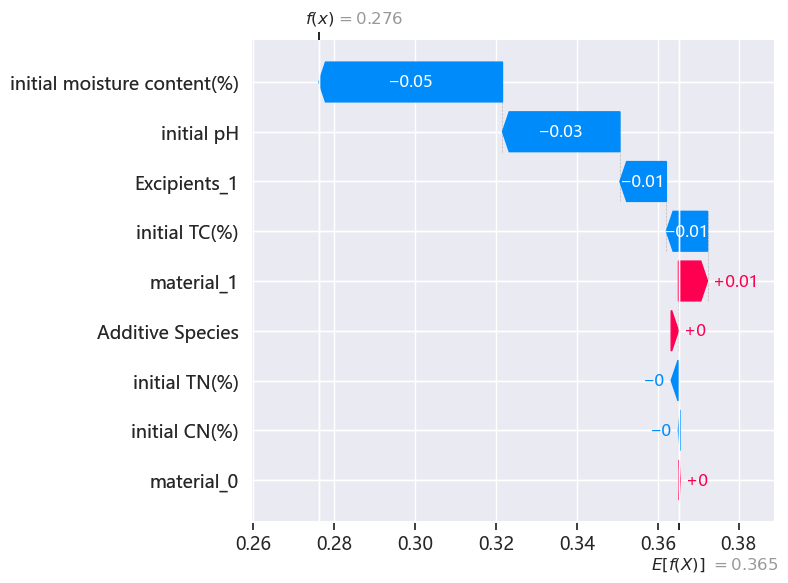

In [44]:
# # 计算SHAP值
# shap_values = lgb_explainer.shap_values(X_train)

# # 将SHAP值数组转换为Explanation对象
# shap_explanation = shap.Explanation(values=shap_values[0], base_values=lgb_explainer.expected_value[0], data=X_train.iloc[0])

# # 绘制瀑布图
# shap.waterfall_plot(shap_explanation)


expected_value_scalar = lgb_explainer.expected_value[0] if isinstance(lgb_explainer.expected_value, (np.ndarray, list)) else lgb_explainer.expected_value

# 设置大一点的图表尺寸
plt.figure(figsize=(12, 8))
# print(type(lgb_explainer.expected_value))
shap.plots._waterfall.waterfall_legacy(
    expected_value_scalar,  
    lgb_shap_values[0], 
    feature_names=X_train.columns,
    show=False)

# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

# 保存结果为图片文件
plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_e1_m2.png', format='png')

plt.show()


上图的解释显示了每个有助于将模型输出从基值（我们传递的训练数据集上的平均模型输出）贡献到模型输出值的特征。将预测推高的特征以红色显示，将预测推低的特征以蓝色显示。

如果我们采取许多实例来聚合显示解释，如下图所示，将它们旋转 90 度，然后将它们水平堆叠，我们可以看到整个数据集的解释（在 Notebook 中，此图是交互式的）

In [45]:
import shap

# 假设您已经生成了 lgb_explainer 和 lgb_shap_values



# 保存SHAP力图为HTML文件
shap_html = shap.force_plot(lgb_explainer.expected_value, lgb_shap_values, X_train, matplotlib=False)
shap.save_html(f"output/{target}_shap/{model_dict_str[best_model]}_sv_all.html", shap_html)



下图中每一行代表一个特征，横坐标为SHAP值。一个点代表一个样本，颜色越红说明特征本身数值越大，颜色越蓝说明特征本身数值越小。

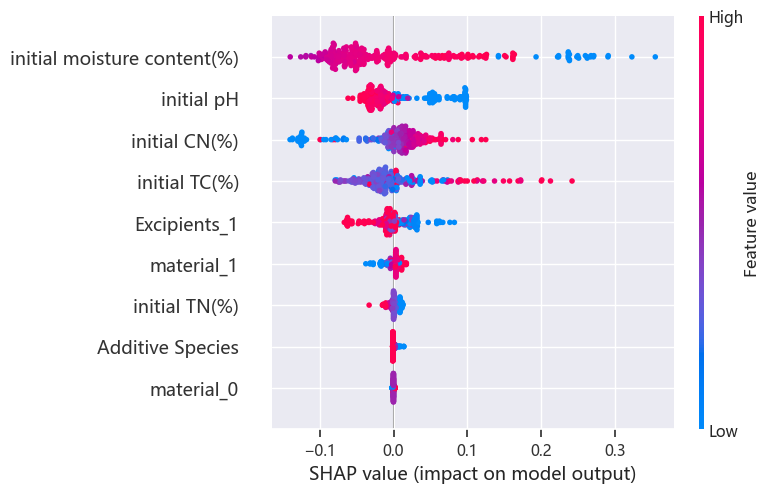

In [46]:
# 设置大一点的图表尺寸
plt.figure(figsize=(12, 8))

shap.summary_plot(lgb_shap_values, X_train,show=False)


# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_all.png', format='png')
plt.show()


shap value值排序的特征重要性

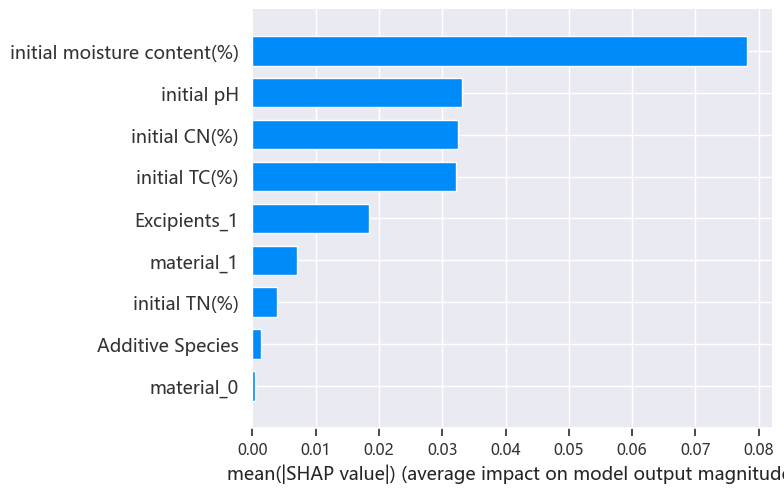

In [47]:
# 设置大一点的图表尺寸
plt.figure(figsize=(12, 8))

shap.summary_plot(lgb_shap_values, X_train, plot_type="bar", show=False)

# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_fi_sort.png', format='png')

plt.show()

SHAP也提供了部分依赖图的功能，与传统的部分依赖图不同的是，这里纵坐标不是目标变量y的数值而是SHAP值。可以观察各个特征的分布与目标shap值的关系。

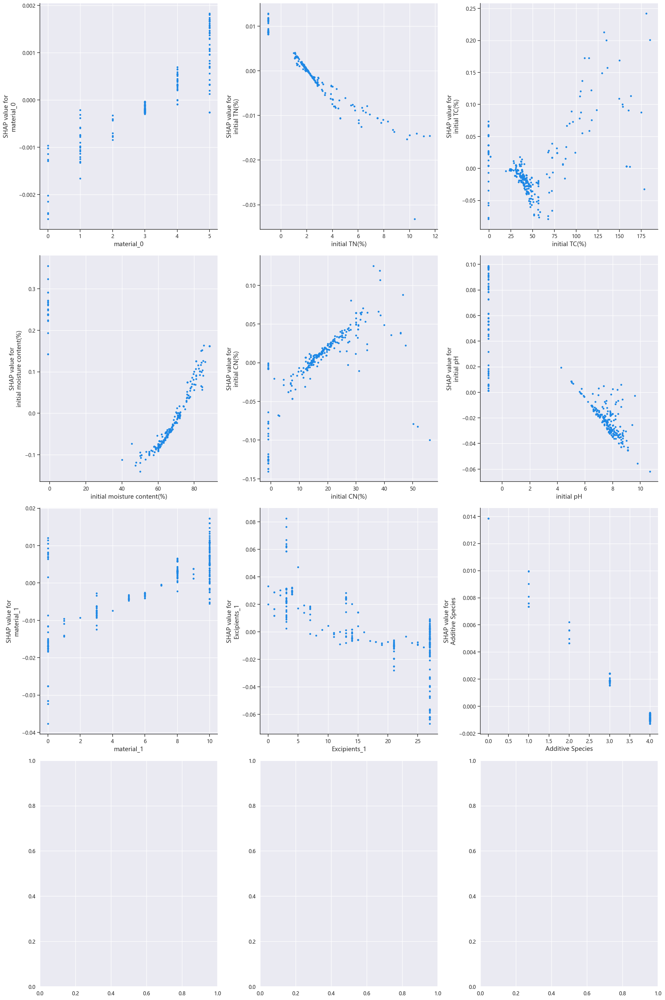

In [48]:
fig, axes = plt.subplots(len(input_cols)//3+1, 3, figsize=(20,30))
for i, col in enumerate(input_cols):
    shap.dependence_plot(col, lgb_shap_values, X_train, interaction_index=None, show=False, ax=axes[i//3,i%3])


# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

# 保存结果为图片文件
plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_pd.png', format='png')
plt.show()

- 对多个变量的交互进行分析

我们也可以多个变量的交互作用进行分析。一种方式是采用summary_plot描绘出散点图，如下：

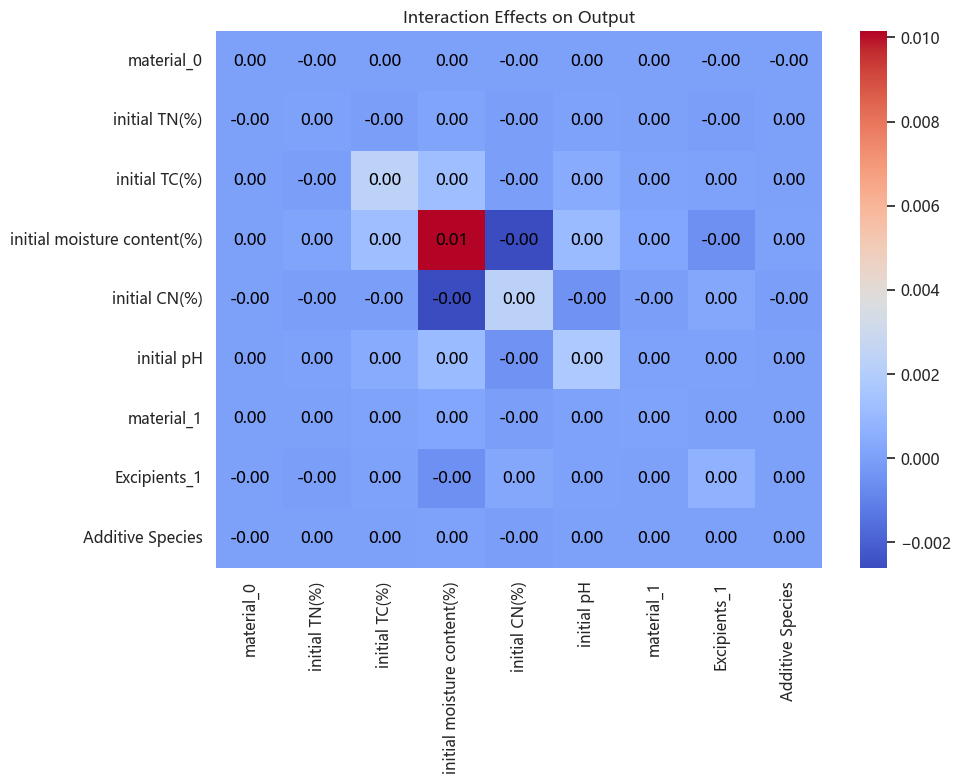

In [49]:
if not (best_model == 'SVR(k)' or best_model == "MLP(k)" or best_model == 'GaussR(k)'):


    shap_interaction_values = shap.TreeExplainer(shap_model).shap_interaction_values(X_train)



    shap.summary_plot(shap_interaction_values, X_train, max_display=6, show=False)
    # 调整图表布局，确保图形元素不会相互重叠
    plt.tight_layout()

    # 保存结果为图片文件
    plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_all_iv.png', format='png')
    
    # 计算交互值
    s = lgb_shap_values
    shap_interaction_values = np.sum(np.abs(s), axis=0) - np.abs(s)

    # 获取特征名称
    feature_names = list(X_train.columns)

    # 由于交互值通常是一个方阵，我们需要将计算结果转换为方阵的形式
    # 我们可以通过取每个特征组合的交互值的平均值来做这件事
    n_features = lgb_shap_values.shape[1]
    interaction_matrix = np.zeros((n_features, n_features))

    # 填充交互矩阵
    for i in range(n_features):
        for j in range(n_features):
            # 举例来说，交互值可以是特征 i 和 j 的 SHAP 值的乘积的平均值
            interaction_matrix[i, j] = np.mean(lgb_shap_values[:, i] * lgb_shap_values[:, j])

    plt.figure(figsize=(10, 8))
    sns.heatmap(interaction_matrix, annot=False, fmt=".2f", cmap="coolwarm", 
                xticklabels=feature_names, yticklabels=feature_names,
                annot_kws={'fontsize': 10})
    
        # 手动添加标注
    for i in range(n_features):
        for j in range(n_features):
            plt.text(j+0.5, i+0.5, "{:.2f}".format(interaction_matrix[i, j]), ha='center', va='center', color='black')
    plt.title('Interaction Effects on Output')
    # 调整图表布局，确保图形元素不会相互重叠
    plt.tight_layout()
    plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_all_iv_heatmaps.png', format='png')
    plt.show()

    plt.show()
else:
    # 计算交互值
    s = lgb_shap_values
    shap_interaction_values = np.sum(np.abs(s), axis=0) - np.abs(s)

    # 获取特征名称
    feature_names = list(X_train.columns)

    # 由于交互值通常是一个方阵，我们需要将计算结果转换为方阵的形式
    # 我们可以通过取每个特征组合的交互值的平均值来做这件事
    n_features = lgb_shap_values.shape[1]
    interaction_matrix = np.zeros((n_features, n_features))

    # 填充交互矩阵
    for i in range(n_features):
        for j in range(n_features):
            # 举例来说，交互值可以是特征 i 和 j 的 SHAP 值的乘积的平均值
            interaction_matrix[i, j] = np.mean(lgb_shap_values[:, i] * lgb_shap_values[:, j])

    plt.figure(figsize=(10, 8))
    sns.heatmap(interaction_matrix, annot=False, fmt=".2f", cmap="coolwarm", 
                xticklabels=feature_names, yticklabels=feature_names,
                annot_kws={'fontsize': 10})
    
        # 手动添加标注
    for i in range(n_features):
        for j in range(n_features):
            plt.text(j+0.5, i+0.5, "{:.2f}".format(interaction_matrix[i, j]), ha='center', va='center', color='black')
    plt.title('Interaction Effects on Output')
    # 调整图表布局，确保图形元素不会相互重叠
    plt.tight_layout()
    plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_all_iv_heatmaps.png', format='png')
    plt.show()

我们也可以用dependence_plot描绘两个变量交互下变量对目标值的影响。

<Figure size 1200x800 with 0 Axes>

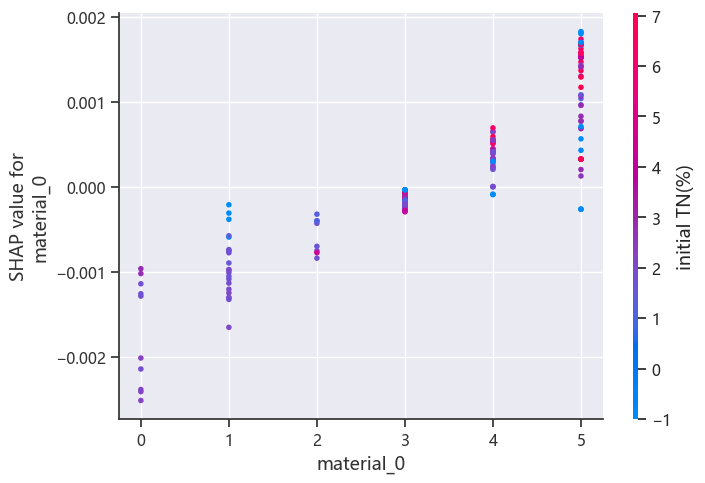

In [50]:
# 设置大一点的图表尺寸
plt.figure(figsize=(12, 8))

shap.dependence_plot(input_cols[0], lgb_shap_values, X_train, interaction_index=input_cols[1], show=False)

# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

# 保存结果为图片文件
plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_pd2.png', format='png')
plt.show()

也能可视化每种特征对于整体预测值的影响。

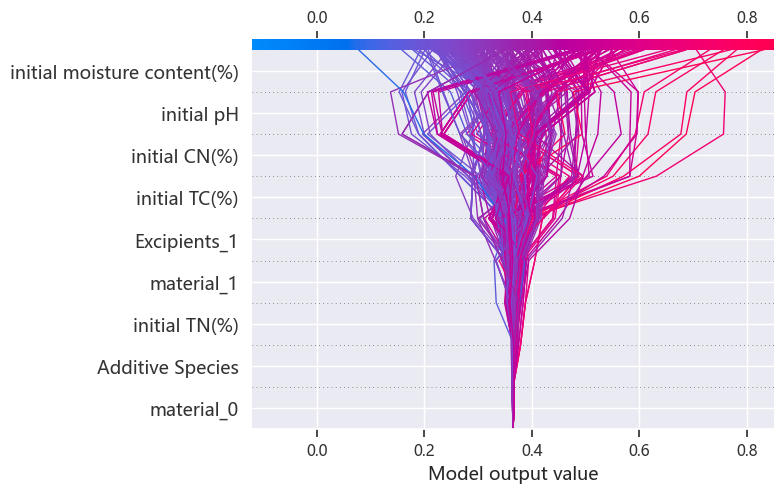

In [51]:
# 设置大一点的图表尺寸
plt.figure(figsize=(12, 8))

shap.decision_plot(lgb_explainer.expected_value, lgb_shap_values, X_train, ignore_warnings=True, show=False)


# 调整图表布局，确保图形元素不会相互重叠
plt.tight_layout()

# 保存结果为图片文件
plt.savefig(f'output/{target}_shap/{model_dict_str[best_model]}_sv_ef_o.png', format='png')

plt.show()

In [52]:
logging.info(' ')